# **All Locations Total**

After doing some tests and knowing the issues with data. The forecast is done for each artikel for all locations.


The estimation is for each artikel separately. We take data start point as 2017 and then use 3 years to forecast the next year. And we take weekly peaks

### The following steps are taken:

##### *Algorithm Validation*
- The algorithm is trained on data from 2017 till 2019 and a prediction is done for 2020.
- This is validated against 2020 data.

##### *Analysis for 2021- Effect of Corona*
- The newly validated alogrithm is now trained until 2020 and a prediction is made for 2021.
- This shows the effect of corona

##### *Forecast for 2022*
- The newly validated alogrithm is now trained until 2021 and a prediction is made for 2022.

In [1]:
#loading libraries and functions
import os 
import sys
sys.path.append('/home/amey/Projects/BUKO_Forecasting/Modelling/model')
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import forecasting_functions as ff
import importlib
from statsmodels.tsa.holtwinters import ExponentialSmoothing
dirname='/home/amey/Projects/BUKO_Forecasting/'
forecast_data=os.path.join(dirname,'Modelling','forecast_processed_data')

## **J16-90**

In [3]:

importlib.reload(ff)
region='All Locations'
artikel_code='J16-90'
ini_start_year_train=2017
end_year_train=2019
artikel_ts,train_ts=ff.get_data_series(region,artikel_code,dirname,ini_start_year_train,end_year_train)
# print('Training series is:'+str(train_ts))
train_ts=train_ts[2:]
print('Training series is:'+str(train_ts))

Training series is:2016-12-25    1583.0
2017-01-01    1359.0
2017-01-08     637.0
2017-01-15     780.0
2017-01-22    1117.0
               ...  
2019-12-01    3884.0
2019-12-08    3762.0
2019-12-15    3522.0
2019-12-22    3307.0
2019-12-29    2715.0
Name: Net_week_art, Length: 158, dtype: float64


### ***Model Developement and Validation***

Note that some time one needs to adjust the training time seires to have a correct prediction start.

#### Time series analysis

Now we plot a Auto correlation of the time series to see whether it correlates to a yearly data.

0.9376419200356378
0.33468473868406884
0.8639357713055409
0.9310054938713361
0.3636185895378596


<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

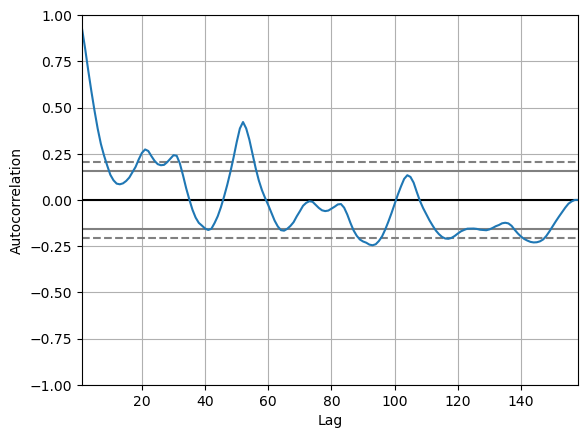

In [4]:
# lags based on weeks
lagvec=[1,25,52,52*2,int(52*2.5)]
for lag in lagvec:
    x=train_ts.autocorr(lag=lag)
    print(x)
pd.plotting.autocorrelation_plot(train_ts)

Seems like the series has a nice correlation for a year data (around 52 weeks) and also 26 weeks. The correlation goes down for 2 or larger years. 

#### Decomposing the series

The series can be decomposed into trend, sesonality and residual.

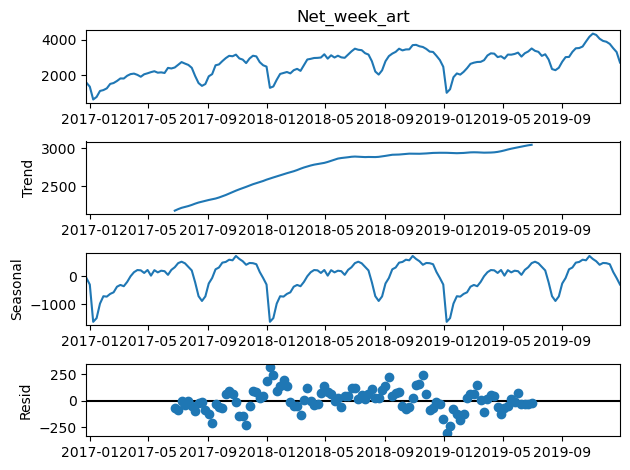

In [5]:
import statsmodels.api as sm
result=sm.tsa.seasonal_decompose(train_ts,model='add',period=52*1)

# plt.figure*()
fig1=result.plot()
fig1.tight_layout()
#based on the figure we see residual of 250
resid=250.0

There is clearly an increasing trend which migh plateau in 2020. Importantly the seasonality pattern suggests that there are definite times in the year when certain orders are placed. 

**Important**

The residual (resid) gives a hint that these are spurious orders over the years which have will be difficult to be captured by the prediction algorithm. Thus, we can say that the uncertainty in our prediction would be around the max of this residual i.e. *250*


#### Model

In [6]:
model_20=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_20.fit()#location
artikel_data_loc=os.path.join(forecast_data,region,artikel_code)
summary_loc=os.path.join(artikel_data_loc,'model_summary.data')
with open(summary_loc,'w') as f:
    f.write(str(mod_result.summary()))

print(mod_result.summary())


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  158
Model:             ExponentialSmoothing   SSE                        1918916.989
Optimized:                         True   AIC                           1599.939
Trend:                         Additive   BIC                           1774.507
Seasonal:                Multiplicative   AICC                          1672.184
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         10:36:43
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9949997                alpha                 True
smoothing_trend          

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Testing for the fitting of model versus observed data.

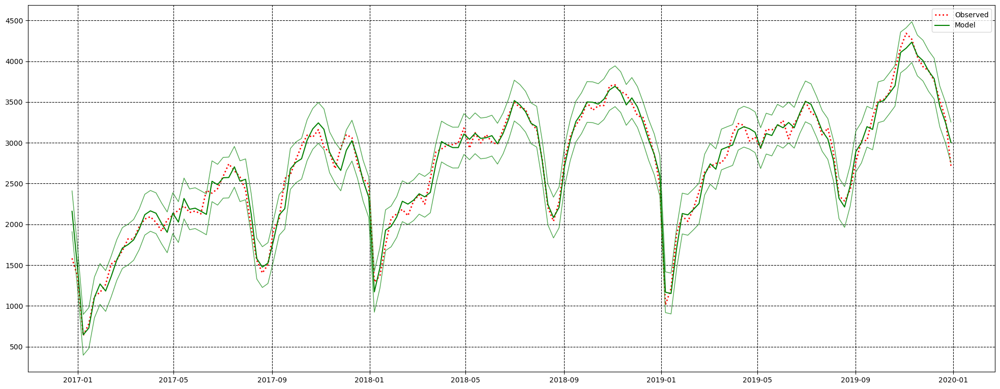

In [8]:
importlib.reload(ff)
fname=os.path.join(artikel_data_loc,'Testing_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)


Testing for forecasting on 2020.

In [9]:
#2020 observations ts
start_year_train=ini_start_year_train
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
vald_ts=artikel_ts[start:start+52*end_int+1]
print(vald_ts)
print(vald_ts[-53:-49])
#take initial 1521 at week 1

2017-01-01    1359.0
2017-01-08     637.0
2017-01-15     780.0
2017-01-22    1117.0
2017-01-29    1166.0
               ...  
2020-11-29    4162.0
2020-12-06    4322.0
2020-12-13    4073.0
2020-12-20    3970.0
2020-12-27    3311.0
Name: Net_week_art, Length: 209, dtype: float64
2019-12-29    2715.0
2020-01-05    1521.0
2020-01-12    1279.0
2020-01-19    2080.0
Name: Net_week_art, dtype: float64


Saving done


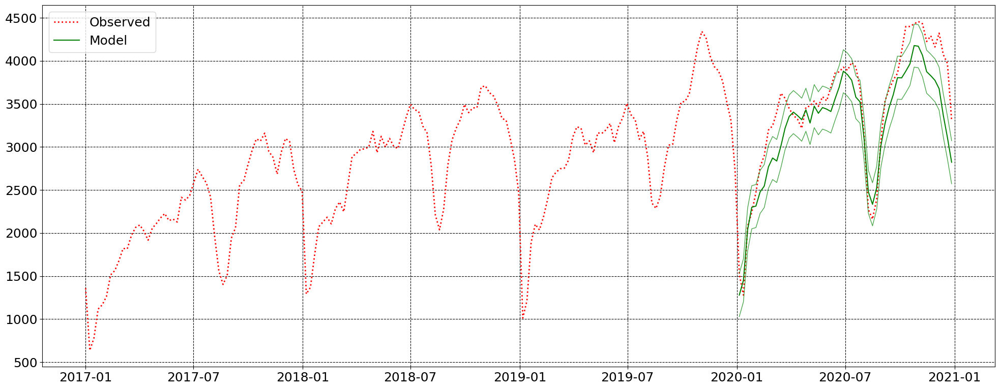

In [10]:
importlib.reload(ff)
forecast_2020=mod_result.forecast(52)
# simulate_2020=mod_result.simulate(52,repetitions=10)
fname=os.path.join(artikel_data_loc,'Testing_Forecast_2020.jpg')
ff.plot_mod_obs(vald_ts,forecast_2020,resid,fname)
fname='Forecast_2020.csv'
ff.create_fcast_csv(forecast_2020,resid,fname,artikel_data_loc)

### Validation

(Corona effect)

Now the train_ts is replaced by the validation ts and a 2021 forecast is made

In [12]:
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts)

2017-12-31    2486.0
2018-01-07    1292.0
2018-01-14    1369.0
2018-01-21    1746.0
2018-01-28    2074.0
               ...  
2020-11-29    4162.0
2020-12-06    4322.0
2020-12-13    4073.0
2020-12-20    3970.0
2020-12-27    3311.0
Name: Net_week_art, Length: 157, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                        3407922.693
Optimized:                         True   AIC                           1681.703
Trend:                         Additive   BIC                           1855.909
Seasonal:                Multiplicative   AICC                          1754.692
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         10:37:51
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.5707144                alpha                 True
smoothing_trend          

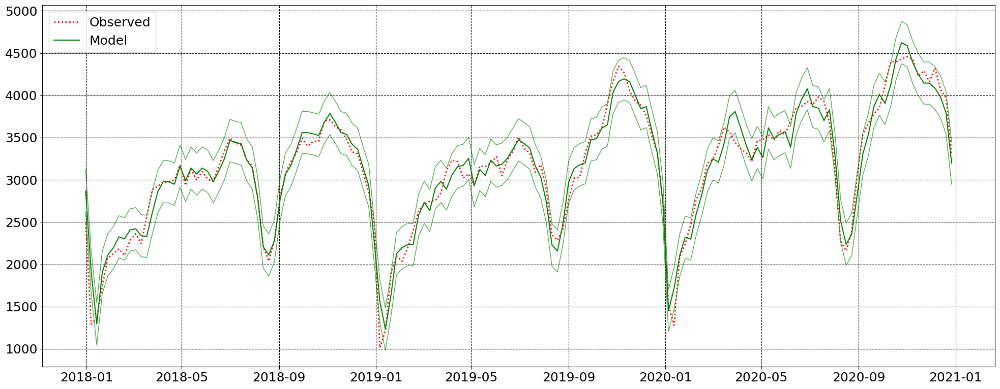

In [13]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

*Forecast for 2021*

In [14]:
#2021 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
vald21_ts=artikel_ts[start:start+52*end_int+2]
print(vald21_ts)
# print(vald21_ts[-53:-49])

2018-12-30    2477.0
2019-01-06    1013.0
2019-01-13    1214.0
2019-01-20    1890.0
2019-01-27    2102.0
               ...  
2021-12-05    5134.0
2021-12-12    5222.0
2021-12-19    5100.0
2021-12-26    4841.0
2022-01-02    3952.0
Name: Net_week_art, Length: 158, dtype: float64


Plotting against observed

Saving done


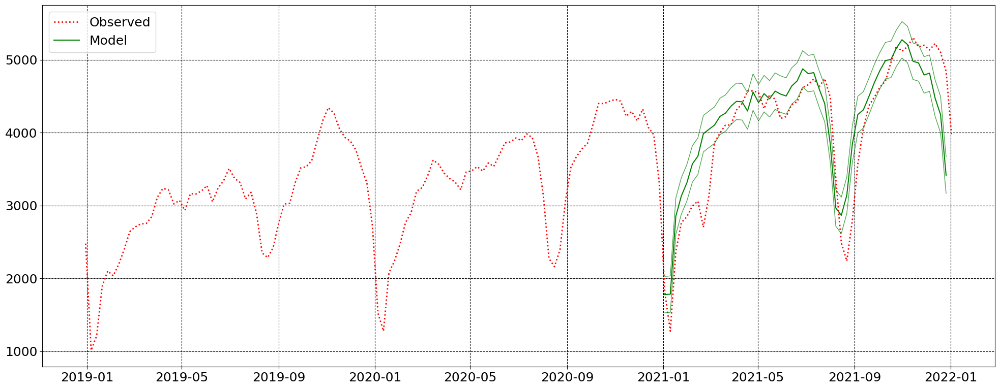

In [16]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()
fname=os.path.join(artikel_data_loc,'Validation_forecast_2021.jpg')
ff.plot_mod_obs(vald21_ts,forecast_2021,resid,fname)
fname='Forecast_2021.csv'
ff.create_fcast_csv(forecast_2021,resid,fname,artikel_data_loc)

### Forecast 2022

Train data till 2021


In [17]:
#2022 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52+0)
end_int=int(2022-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+3]
print(train_ts)

2018-12-30    2477.0
2019-01-06    1013.0
2019-01-13    1214.0
2019-01-20    1890.0
2019-01-27    2102.0
               ...  
2021-12-12    5222.0
2021-12-19    5100.0
2021-12-26    4841.0
2022-01-02    3952.0
2022-01-09    1813.0
Name: Net_week_art, Length: 159, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  159
Model:             ExponentialSmoothing   SSE                        6750952.254
Optimized:                         True   AIC                           1808.350
Trend:                         Additive   BIC                           1983.278
Seasonal:                Multiplicative   AICC                          1879.865
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         10:39:51
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.7474995                alpha                 True
smoothing_trend          

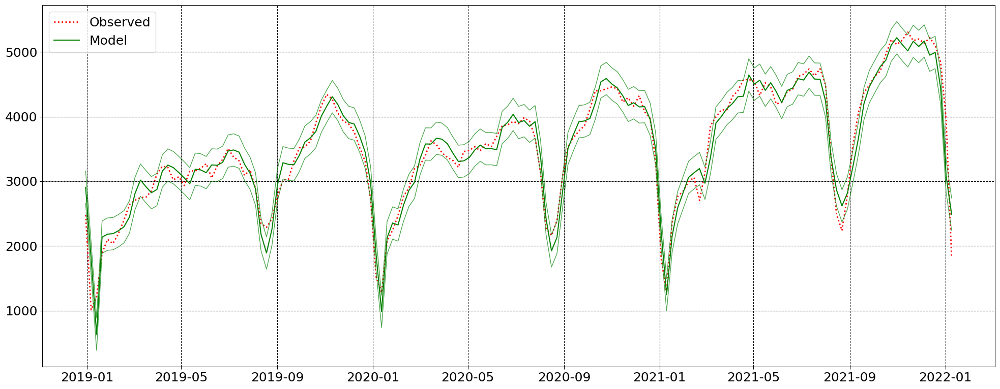

In [18]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2022.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

In [19]:
#2021 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald22_ts=artikel_ts[start:start+52*end_int+2]
print(vald22_ts)
# print(vald22_ts[-53:-49])


2019-12-29    2715.0
2020-01-05    1521.0
2020-01-12    1279.0
2020-01-19    2080.0
2020-01-26    2240.0
               ...  
2022-12-04    5906.0
2022-12-11    5762.0
2022-12-18    5586.0
2022-12-25    5070.0
2023-01-01    4040.0
Name: Net_week_art, Length: 158, dtype: float64


Saving done


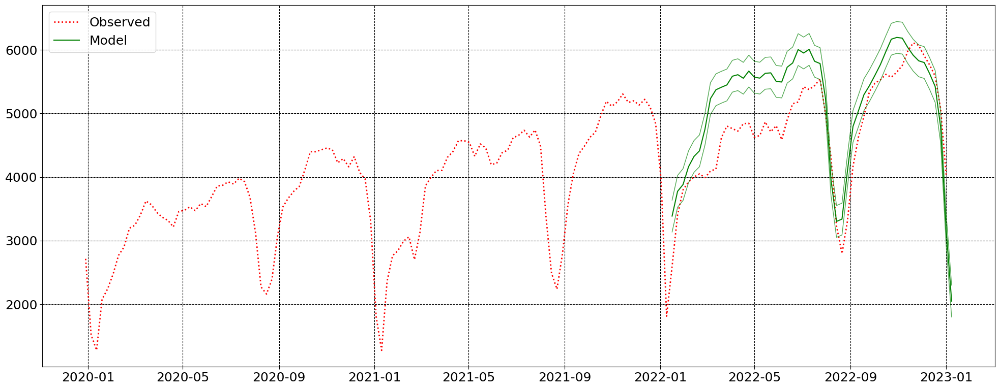

In [20]:
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()
#since the forecast depends on the starting value
# forecast_2022=forecast_2022-1920
mod_net=pd.concat([mod_result.fittedvalues,forecast_2022])
#2021 forecast time series
fname=os.path.join(artikel_data_loc,'Forecast22.jpg')
ff.plot_mod_obs(vald22_ts,forecast_2022,resid,fname)
fname='Forecast_2022.csv'
ff.create_fcast_csv(forecast_2022,resid,fname,artikel_data_loc)

### Forecast 2023

Train data till 2022


In [21]:
#2022 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52+0)
end_int=int(2023-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+3]
print(train_ts)

2019-12-29    2715.0
2020-01-05    1521.0
2020-01-12    1279.0
2020-01-19    2080.0
2020-01-26    2240.0
               ...  
2022-12-04    5906.0
2022-12-11    5762.0
2022-12-18    5586.0
2022-12-25    5070.0
2023-01-01    4040.0
Name: Net_week_art, Length: 158, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  158
Model:             ExponentialSmoothing   SSE                        6087623.572
Optimized:                         True   AIC                           1782.349
Trend:                         Additive   BIC                           1956.917
Seasonal:                Multiplicative   AICC                          1854.594
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         10:41:36
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.6767856                alpha                 True
smoothing_trend          

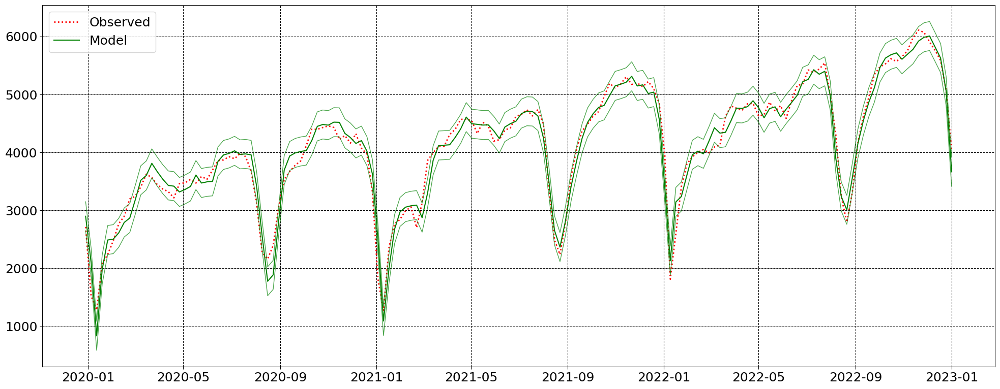

In [22]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2023.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

In [23]:
#2022 observations ts
start_year_train=ini_start_year_train+4
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald23_ts=artikel_ts[start:start+52*end_int+2]
print(vald23_ts)
# print(vald22_ts[-53:-49])


2020-12-27    3311.0
2021-01-03    1811.0
2021-01-10    1276.0
2021-01-17    2362.0
2021-01-24    2765.0
               ...  
2022-12-04    5906.0
2022-12-11    5762.0
2022-12-18    5586.0
2022-12-25    5070.0
2023-01-01    4040.0
Name: Net_week_art, Length: 106, dtype: float64


Saving done


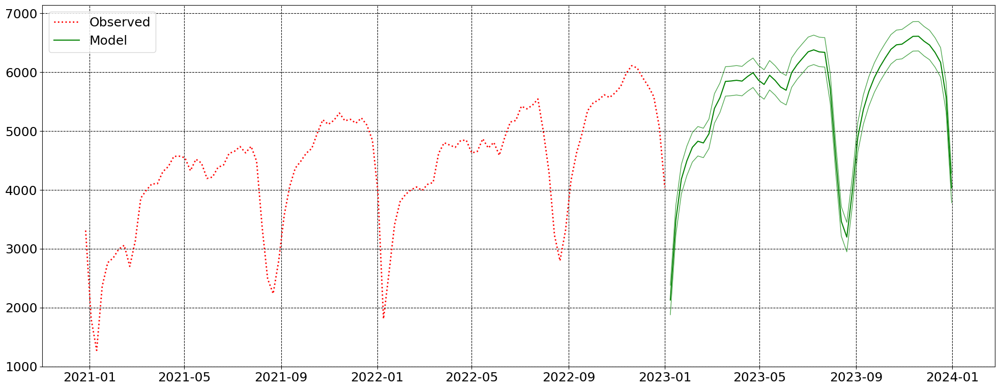

In [24]:
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()
#since the forecast depends on the starting value
# forecast_2022=forecast_2022-1920
mod_net=pd.concat([mod_result.fittedvalues,forecast_2023])
#2021 forecast time series
fname=os.path.join(artikel_data_loc,'Forecast23.jpg')
ff.plot_mod_obs(vald23_ts,forecast_2023,resid,fname)
fname='Forecast_2023.csv'
ff.create_fcast_csv(forecast_2023,resid,fname,artikel_data_loc)

##### **END J16-90** 

## **AHEK**

In [27]:

importlib.reload(ff)
region='All Locations'
artikel_code='AHEK'
ini_start_year_train=2017
end_year_train=2019
artikel_ts,train_ts=ff.get_data_series(region,artikel_code,dirname,ini_start_year_train,end_year_train)
# print('Training series is:'+str(train_ts))
train_ts=train_ts[2:]
print('Training series is:'+str(train_ts))

Training series is:2016-12-25    3059.0
2017-01-01    2567.0
2017-01-08    1262.0
2017-01-15    1271.0
2017-01-22    1786.0
               ...  
2019-12-01    6407.0
2019-12-08    6169.0
2019-12-15    5637.0
2019-12-22    5147.0
2019-12-29    4348.0
Name: Net_week_art, Length: 158, dtype: float64


### ***Model Developement and Validation***

Note that some time one needs to adjust the training time seires to have a correct prediction start.

#### Time series analysis

Now we plot a Auto correlation of the time series to see whether it correlates to a yearly data.

0.951061573980367
0.5487558730580233
0.9025078994100099
0.9481645283165003
0.3928501133399597


<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

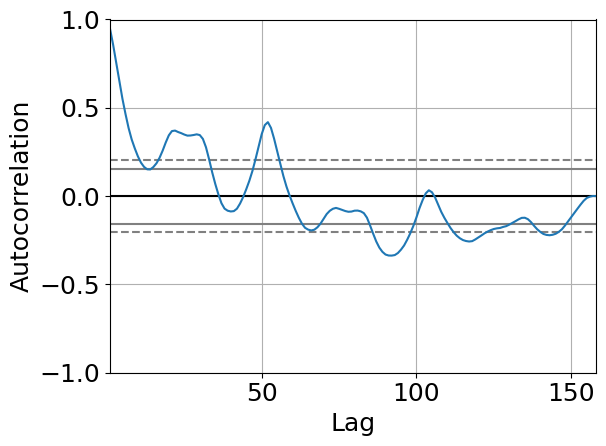

In [28]:
# lags based on weeks
lagvec=[1,25,52,52*2,int(52*2.5)]
for lag in lagvec:
    x=train_ts.autocorr(lag=lag)
    print(x)
pd.plotting.autocorrelation_plot(train_ts)

Seems like the series has a nice correlation for a year data (around 52 weeks) and also 26 weeks. The correlation goes down for 2 or larger years. 

#### Decomposing the series

The series can be decomposed into trend, sesonality and residual.

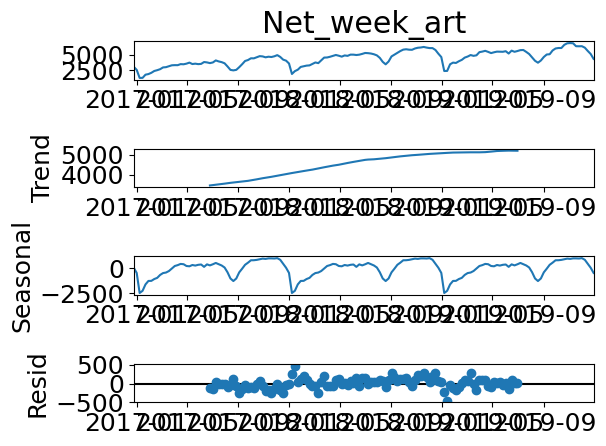

In [29]:
import statsmodels.api as sm
result=sm.tsa.seasonal_decompose(train_ts,model='add',period=52*1)

# plt.figure*()
fig1=result.plot()
fig1.tight_layout()
#based on the figure
resid=500

There is clearly an increasing trend which migh plateau in 2020. Importantly the seasonality pattern suggests that there are definite times in the year when certain orders are placed. 

**Important**

The residual (resid) gives a hint that these are spurious orders over the years which have will be difficult to be captured by the prediction algorithm. Thus, we can say that the uncertainty in our prediction would be around the max of this residual i.e. *250*


#### Model

In [30]:
model_20=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_20.fit()#location
artikel_data_loc=os.path.join(forecast_data,region,artikel_code)
summary_loc=os.path.join(artikel_data_loc,'model_summary.data')
with open(summary_loc,'w') as f:
    f.write(str(mod_result.summary()))

print(mod_result.summary())

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  158
Model:             ExponentialSmoothing   SSE                        3200913.194
Optimized:                         True   AIC                           1680.784
Trend:                         Additive   BIC                           1855.351
Seasonal:                Multiplicative   AICC                          1753.028
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         10:50:51
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.7121428                alpha                 True
smoothing_trend          

Testing for the fitting of model versus observed data.

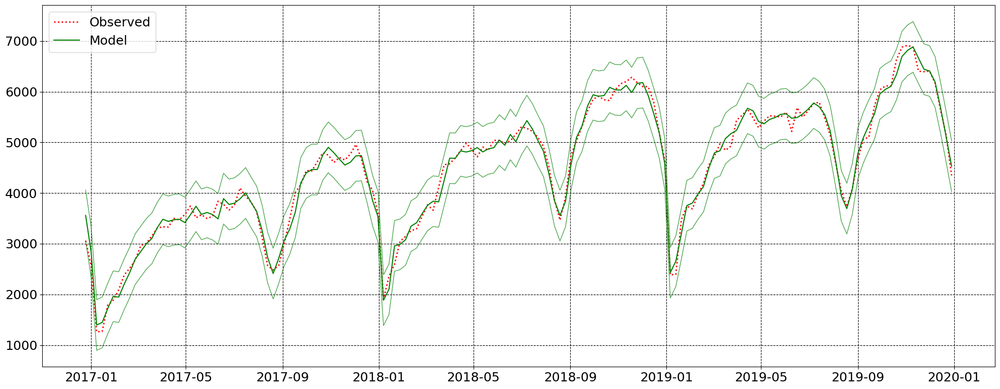

In [31]:
importlib.reload(ff)
fname=os.path.join(artikel_data_loc,'Testing_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)


Testing for forecasting on 2020.

In [32]:
#2020 observations ts
start_year_train=ini_start_year_train
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
vald_ts=artikel_ts[start:start+52*end_int+1]
print(vald_ts)
print(vald_ts[-53:-49])
#take initial 1521 at week 1

2017-01-01    2567.0
2017-01-08    1262.0
2017-01-15    1271.0
2017-01-22    1786.0
2017-01-29    1885.0
               ...  
2020-11-29    6482.0
2020-12-06    6820.0
2020-12-13    6331.0
2020-12-20    6290.0
2020-12-27    5184.0
Name: Net_week_art, Length: 209, dtype: float64
2019-12-29    4348.0
2020-01-05    2336.0
2020-01-12    2122.0
2020-01-19    3324.0
Name: Net_week_art, dtype: float64


Saving done


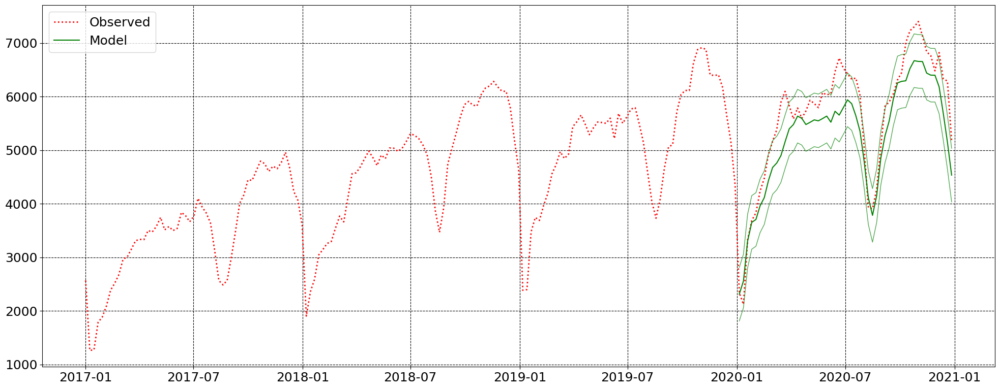

In [33]:
importlib.reload(ff)
forecast_2020=mod_result.forecast(52)

mod_net=pd.concat([mod_result.fittedvalues,forecast_2020])
fname=os.path.join(artikel_data_loc,'Testing_Forecast_2020.jpg')
ff.plot_mod_obs(vald_ts,forecast_2020,resid,fname)
fname='Forecast_2020.csv'
ff.create_fcast_csv(forecast_2020,resid,fname,artikel_data_loc)

### Validation

(Corona Effect)

Now the train_ts is replaced by the validation ts and a 2021 forecast is made

In [44]:
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts)

2017-12-31    3602.0
2018-01-07    1902.0
2018-01-14    2359.0
2018-01-21    2594.0
2018-01-28    3045.0
               ...  
2020-11-29    6482.0
2020-12-06    6820.0
2020-12-13    6331.0
2020-12-20    6290.0
2020-12-27    5184.0
Name: Net_week_art, Length: 157, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                       18618996.576
Optimized:                         True   AIC                           1948.301
Trend:                         Additive   BIC                           2122.507
Seasonal:                Multiplicative   AICC                          2021.291
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         10:52:52
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.1464286                alpha                 True
smoothing_trend          

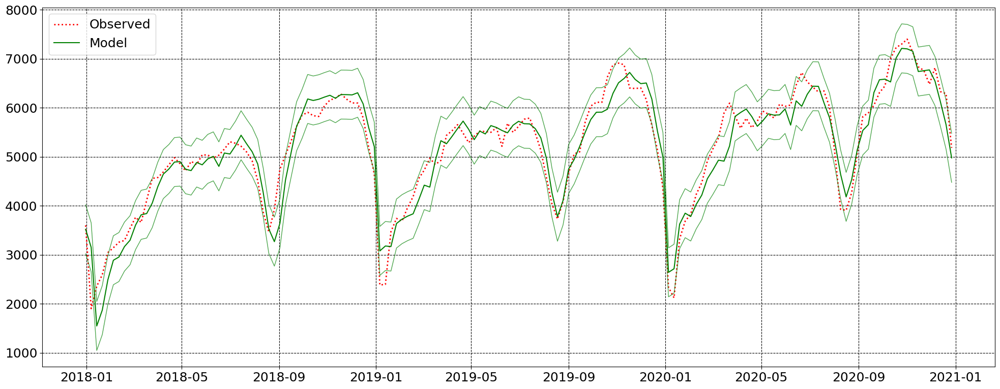

In [45]:
model_21=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
mod_result=model_21.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

*Forecast for 2021*

In [46]:
#2021 observations ts
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
vald21_ts=artikel_ts[start:start+52*end_int+2]
print(vald21_ts)
print(vald21_ts[-53:-49])

2017-12-31    3602.0
2018-01-07    1902.0
2018-01-14    2359.0
2018-01-21    2594.0
2018-01-28    3045.0
               ...  
2021-12-05    7933.0
2021-12-12    7983.0
2021-12-19    7698.0
2021-12-26    7298.0
2022-01-02    6072.0
Name: Net_week_art, Length: 210, dtype: float64
2021-01-03    3159.0
2021-01-10    2361.0
2021-01-17    4050.0
2021-01-24    4650.0
Name: Net_week_art, dtype: float64


Plotting against observed

Saving done


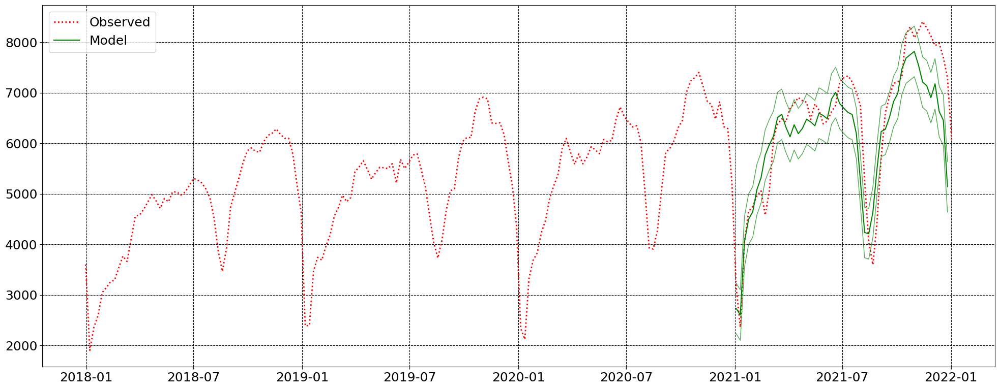

In [47]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()

fname=os.path.join(artikel_data_loc,'Validation_forecastt_2021.jpg')
ff.plot_mod_obs(vald21_ts,forecast_2021,resid,fname)
fname='Forecast_2021.csv'
ff.create_fcast_csv(forecast_2021,resid,fname,artikel_data_loc)

### Forecast 2022

Train data till 2021


In [57]:
#2022 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52+0)
end_int=int(2022-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2019-01-06    2385.0
2019-01-13    2397.0
2019-01-20    3474.0
2019-01-27    3743.0
2019-02-03    3688.0
               ...  
2021-11-28    8126.0
2021-12-05    7933.0
2021-12-12    7983.0
2021-12-19    7698.0
2021-12-26    7298.0
Name: Net_week_art, Length: 156, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                       28888467.036
Optimized:                         True   AIC                           2017.265
Trend:                         Additive   BIC                           2191.471
Seasonal:                Multiplicative   AICC                          2090.255
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         10:55:30
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.8535714                alpha                 True
smoothing_trend          

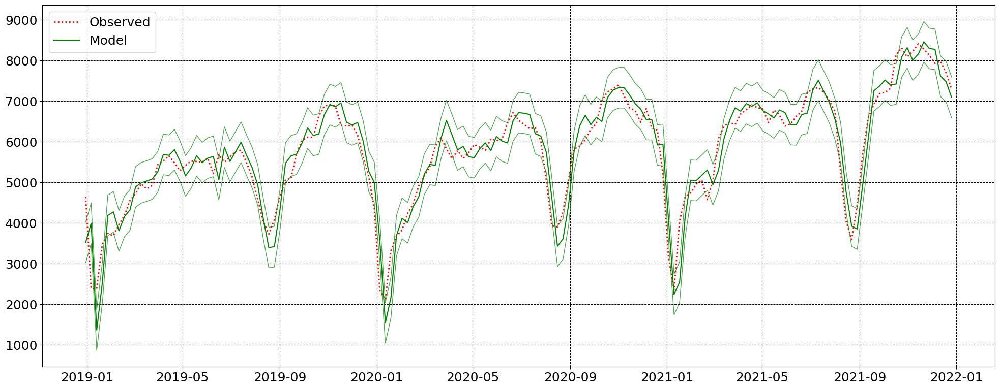

In [58]:
model_22=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_21._initial_level,initial_seasonal=model_21._initial_seasonal,initial_trend=model_21._initial_trend)
# model22=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_22.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2022.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

In [59]:
#2021 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald22_ts=artikel_ts[start:start+52*end_int+2]
print(vald22_ts)
# print(vald22_ts[-53:-49])


2018-12-30    4646.0
2019-01-06    2385.0
2019-01-13    2397.0
2019-01-20    3474.0
2019-01-27    3743.0
               ...  
2022-12-04    8920.0
2022-12-11    8737.0
2022-12-18    8099.0
2022-12-25    7268.0
2023-01-01    5646.0
Name: Net_week_art, Length: 210, dtype: float64


Saving done


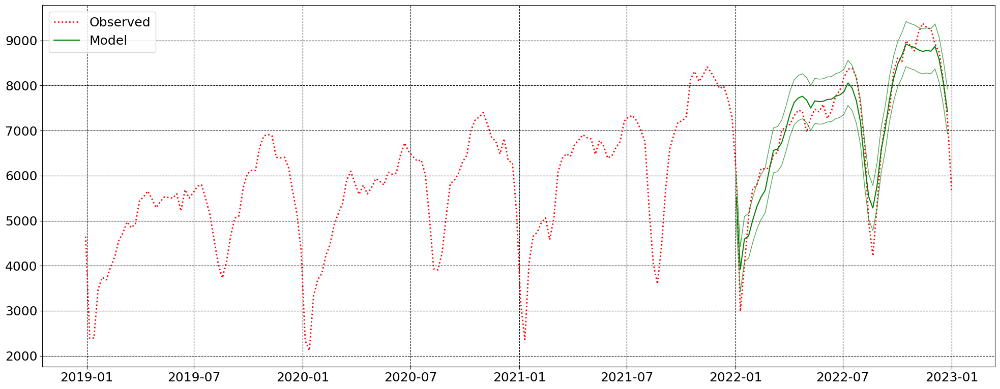

In [60]:
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()

mod_net=pd.concat([mod_result.fittedvalues,forecast_2022])
#2021 forecast time series
fname=os.path.join(artikel_data_loc,'Forecast22.jpg')
ff.plot_mod_obs(vald22_ts,forecast_2022,resid,fname)
fname='Forecast_2022.csv'
ff.create_fcast_csv(forecast_2022,resid,fname,artikel_data_loc)

### Forecast 2023

Train data till 2022


In [64]:
#2023 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52-1)
end_int=int(2023-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2019-12-29    4348.0
2020-01-05    2336.0
2020-01-12    2122.0
2020-01-19    3324.0
2020-01-26    3686.0
               ...  
2022-11-20    9284.0
2022-11-27    9255.0
2022-12-04    8920.0
2022-12-11    8737.0
2022-12-18    8099.0
Name: Net_week_art, Length: 156, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                       35338500.735
Optimized:                         True   AIC                           2048.905
Trend:                         Additive   BIC                           2223.111
Seasonal:                Multiplicative   AICC                          2121.895
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         10:56:40
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.6414286                alpha                 True
smoothing_trend          

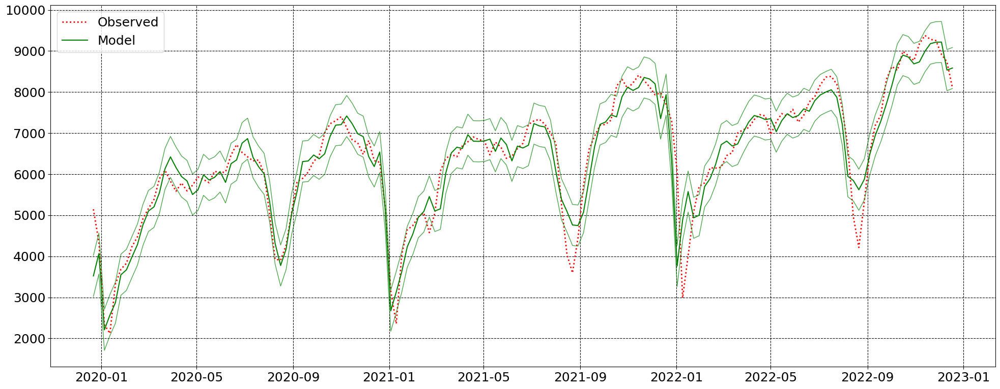

In [65]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_22._initial_level,initial_seasonal=model_22._initial_seasonal,initial_trend=model_22._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2023.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

In [66]:
#2022 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald23_ts=artikel_ts[start:start+52*end_int+2]
print(vald23_ts)
# print(vald22_ts[-53:-49])


2019-12-29    4348.0
2020-01-05    2336.0
2020-01-12    2122.0
2020-01-19    3324.0
2020-01-26    3686.0
               ...  
2022-12-04    8920.0
2022-12-11    8737.0
2022-12-18    8099.0
2022-12-25    7268.0
2023-01-01    5646.0
Name: Net_week_art, Length: 158, dtype: float64


Saving done


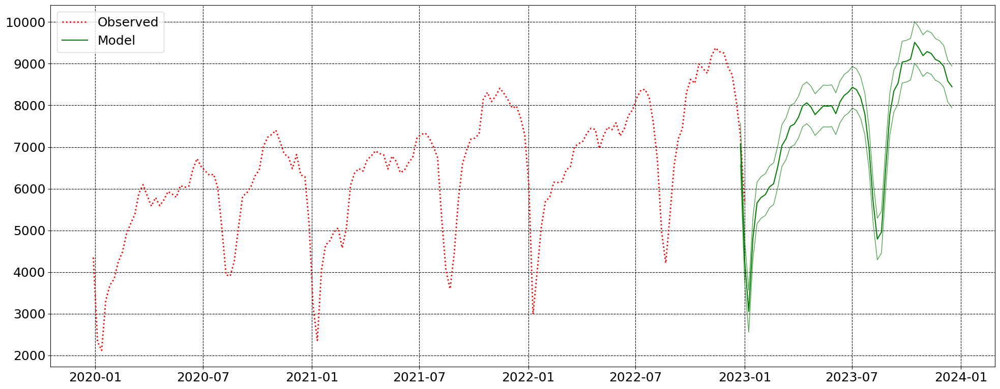

In [67]:

forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()

mod_net=pd.concat([mod_result.fittedvalues,forecast_2023])

fname=os.path.join(artikel_data_loc,'Forecast23.jpg')
ff.plot_mod_obs(vald23_ts,forecast_2023,resid,fname)
fname='Forecast_2023.csv'
ff.create_fcast_csv(forecast_2023,resid,fname,artikel_data_loc)

## **PB6090**

In [3]:

importlib.reload(ff)
region='All Locations'
artikel_code='PB6090'
ini_start_year_train=2017
end_year_train=2019
artikel_ts,train_ts=ff.get_data_series(region,artikel_code,dirname,ini_start_year_train,end_year_train)
# print('Training series is:'+str(train_ts))
train_ts=train_ts[2:]
print('Training series is:'+str(train_ts))

Training series is:2016-12-25    1795.0
2017-01-01    1445.0
2017-01-08     829.0
2017-01-15    1073.0
2017-01-22    1230.0
               ...  
2019-12-01    3911.0
2019-12-08    3807.0
2019-12-15    3212.0
2019-12-22    2629.0
2019-12-29    2193.0
Name: Net_week_art, Length: 158, dtype: float64


### ***Model Developement and Validation***

Note that some time one needs to adjust the training time seires to have a correct prediction start.

#### Time series analysis

Now we plot a Auto correlation of the time series to see whether it correlates to a yearly data.

0.9460900819312478
0.040233657824265995
0.8871822133121559
0.8860931426956562
0.14410120814292823


<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

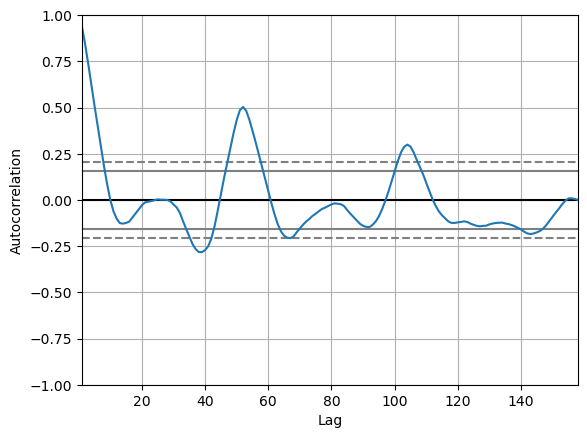

In [4]:
# lags based on weeks
lagvec=[1,25,52,52*2,int(52*2.5)]
for lag in lagvec:
    x=train_ts.autocorr(lag=lag)
    print(x)
pd.plotting.autocorrelation_plot(train_ts)

Seems like the series has a nice correlation for a year data (around 52 weeks) and also 26 weeks. The correlation goes down for 2 or larger years. 

#### Decomposing the series

The series can be decomposed into trend, sesonality and residual.

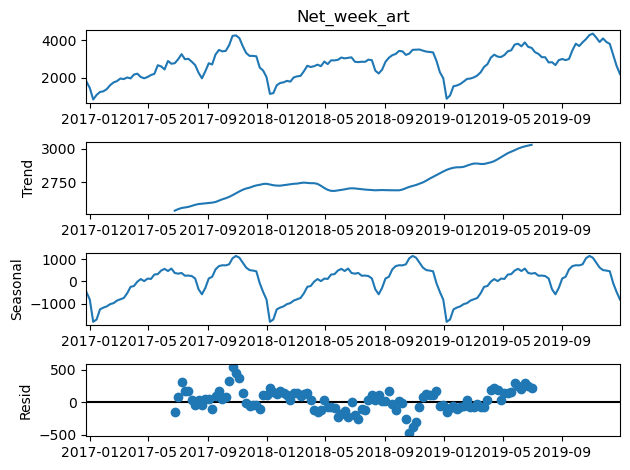

In [5]:
import statsmodels.api as sm
result=sm.tsa.seasonal_decompose(train_ts,model='add',period=52*1)

# plt.figure*()
fig1=result.plot()
fig1.tight_layout()
#residual bnased on below
resid=500

There is clearly an increasing trend which migh plateau in 2020. Importantly the seasonality pattern suggests that there are definite times in the year when certain orders are placed. 

**Important**

The residual (resid) gives a hint that these are spurious orders over the years which have will be difficult to be captured by the prediction algorithm. Thus, we can say that the uncertainty in our prediction would be around the max of this residual i.e. *250*


#### Model

In [6]:
model_20=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_20.fit()#location
artikel_data_loc=os.path.join(forecast_data,region,artikel_code)
summary_loc=os.path.join(artikel_data_loc,'model_summary.data')
with open(summary_loc,'w') as f:
    f.write(str(mod_result.summary()))

print(mod_result.summary())

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  158
Model:             ExponentialSmoothing   SSE                        2931581.739
Optimized:                         True   AIC                           1666.896
Trend:                         Additive   BIC                           1841.464
Seasonal:                Multiplicative   AICC                          1739.141
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         11:07:06
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.8889282                alpha                 True
smoothing_trend          

Testing for the fitting of model versus observed data.

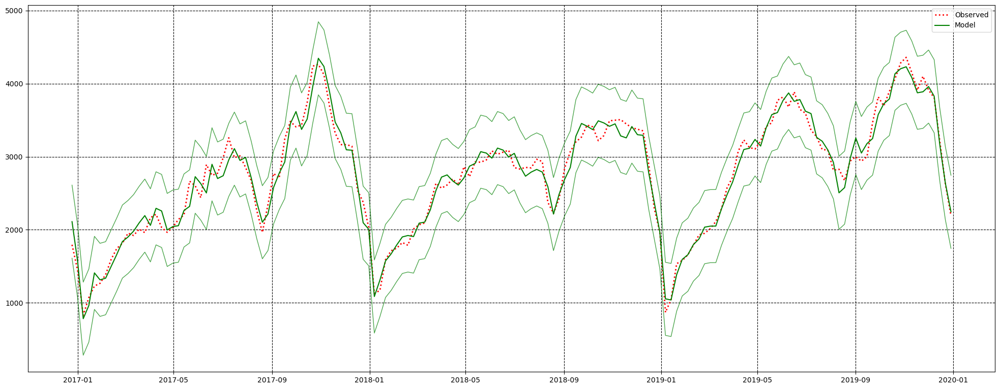

In [7]:
importlib.reload(ff)
fname=os.path.join(artikel_data_loc,'Testing_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)


Testing for forecasting on 2020.

In [8]:
#2020 observations ts
start_year_train=ini_start_year_train
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
vald_ts=artikel_ts[start:start+52*end_int+1]
print(vald_ts)
print(vald_ts[-53:-49])
#take initial 1521 at week 1

2017-01-01    1445.0
2017-01-08     829.0
2017-01-15    1073.0
2017-01-22    1230.0
2017-01-29    1267.0
               ...  
2020-11-29    3970.0
2020-12-06    4093.0
2020-12-13    3986.0
2020-12-20    3799.0
2020-12-27    3075.0
Name: Net_week_art, Length: 209, dtype: float64
2019-12-29    2193.0
2020-01-05    1146.0
2020-01-12    1255.0
2020-01-19    2153.0
Name: Net_week_art, dtype: float64


Saving done


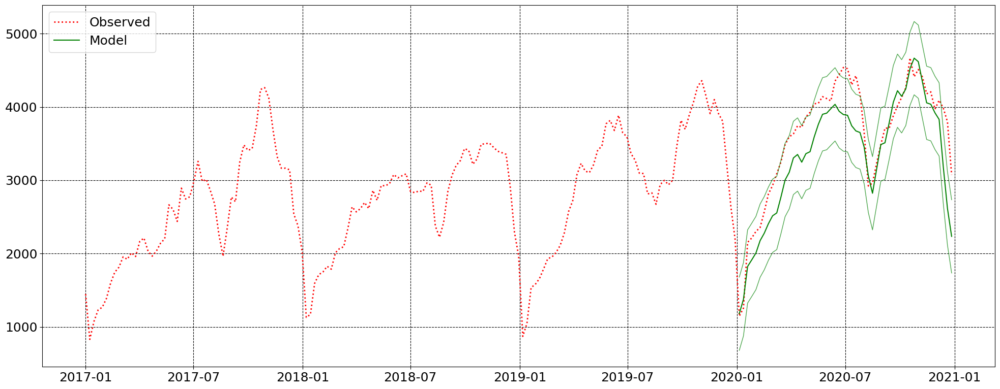

In [9]:
importlib.reload(ff)
forecast_2020=mod_result.forecast(52)

mod_net=pd.concat([mod_result.fittedvalues,forecast_2020])
fname=os.path.join(artikel_data_loc,'Testing_Forecast_2020.jpg')
ff.plot_mod_obs(vald_ts,forecast_2020,resid,fname)
fname='Forecast_2020.csv'
ff.create_fcast_csv(forecast_2020,resid,fname,artikel_data_loc)

### Validation

(Corona Effect)

Now the train_ts is replaced by the validation ts and a 2021 forecast is made

In [10]:
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts)

2017-12-31    2028.0
2018-01-07    1129.0
2018-01-14    1170.0
2018-01-21    1592.0
2018-01-28    1713.0
               ...  
2020-11-29    3970.0
2020-12-06    4093.0
2020-12-13    3986.0
2020-12-20    3799.0
2020-12-27    3075.0
Name: Net_week_art, Length: 157, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                        4666056.831
Optimized:                         True   AIC                           1731.034
Trend:                         Additive   BIC                           1905.240
Seasonal:                Multiplicative   AICC                          1804.024
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         11:07:11
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.5707144                alpha                 True
smoothing_trend          

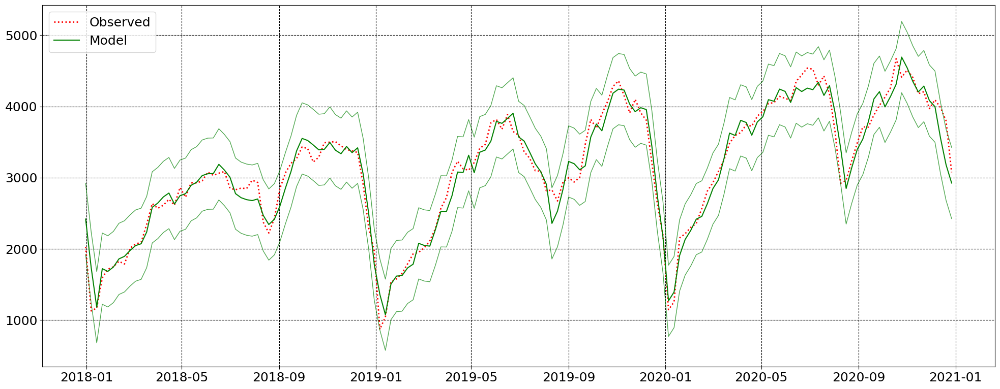

In [11]:
model_21=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
mod_result=model_21.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid, fname)
print(mod_result.summary())

*Forecast for 2021*

In [12]:
#2021 observations ts
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
vald21_ts=artikel_ts[start:start+52*end_int+2]
print(vald21_ts)
# print(vald21_ts[-53:-49])

2017-12-31    2028.0
2018-01-07    1129.0
2018-01-14    1170.0
2018-01-21    1592.0
2018-01-28    1713.0
               ...  
2021-12-05    4171.0
2021-12-12    4052.0
2021-12-19    4006.0
2021-12-26    3332.0
2022-01-02    2855.0
Name: Net_week_art, Length: 210, dtype: float64


Plotting against observed

Saving done


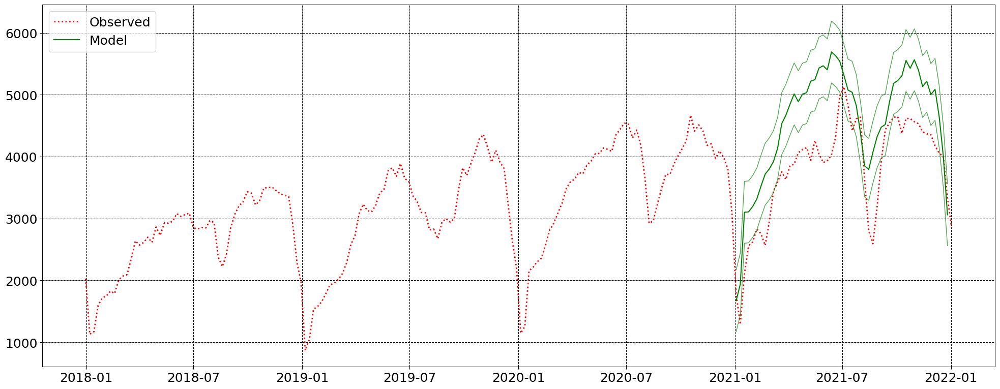

In [13]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()

fname=os.path.join(artikel_data_loc,'Validation_forecastt_2021.jpg')
ff.plot_mod_obs(vald21_ts,forecast_2021,resid,fname)
fname='Forecast_2021.csv'
ff.create_fcast_csv(forecast_2021,resid,fname,artikel_data_loc)

### Forecast 2022

Train data till 2021


In [14]:
#2022 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[:])

2018-12-30    1968.0
2019-01-06     870.0
2019-01-13    1045.0
2019-01-20    1536.0
2019-01-27    1579.0
               ...  
2021-11-28    4353.0
2021-12-05    4171.0
2021-12-12    4052.0
2021-12-19    4006.0
2021-12-26    3332.0
Name: Net_week_art, Length: 157, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                        7616754.383
Optimized:                         True   AIC                           1807.970
Trend:                         Additive   BIC                           1982.176
Seasonal:                Multiplicative   AICC                          1880.959
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         11:07:30
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.8182141                alpha                 True
smoothing_trend          

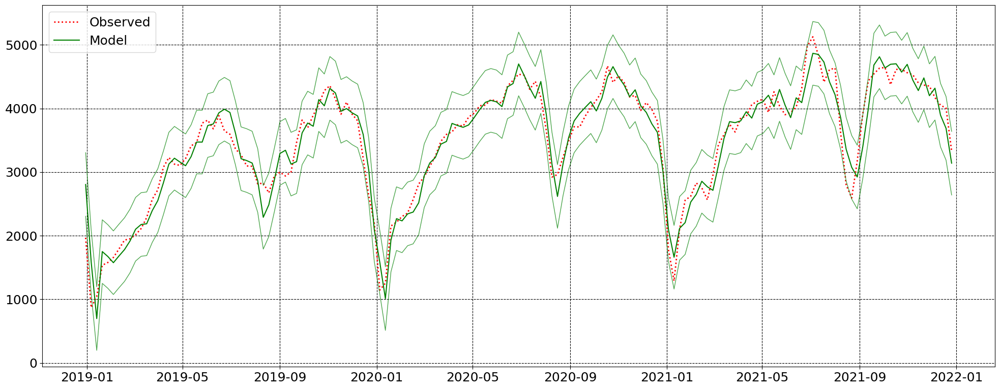

In [15]:
model_22=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_21._initial_level,initial_seasonal=model_21._initial_seasonal,initial_trend=model_21._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_22.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2022.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

In [16]:
#2021 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald22_ts=artikel_ts[start:start+52*end_int+2]
print(vald22_ts)
# print(vald22_ts[-53:-49])


2018-12-30    1968.0
2019-01-06     870.0
2019-01-13    1045.0
2019-01-20    1536.0
2019-01-27    1579.0
               ...  
2022-12-04    5235.0
2022-12-11    5101.0
2022-12-18    4196.0
2022-12-25    4054.0
2023-01-01    3038.0
Name: Net_week_art, Length: 210, dtype: float64


Saving done


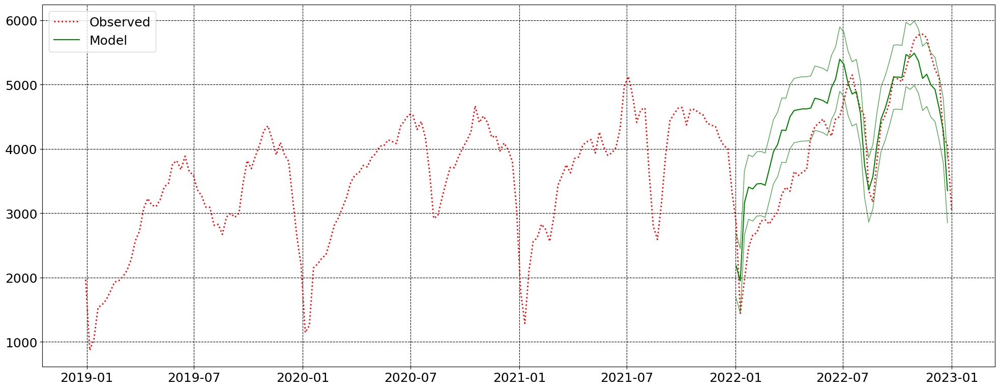

In [17]:
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()
#since the forecast depends on the starting value
# forecast_2022=forecast_2022-1920
mod_net=pd.concat([mod_result.fittedvalues,forecast_2022])
#2021 forecast time series
fname=os.path.join(artikel_data_loc,'Forecast22.jpg')
ff.plot_mod_obs(vald22_ts,forecast_2022,resid,fname)
fname='Forecast_2022.csv'
ff.create_fcast_csv(forecast_2022,resid,fname,artikel_data_loc)

### Forecast 2023

Train data till 2022


In [18]:
#2023 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52-1)
end_int=int(2023-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])
train_ts=train_ts[:]

2019-12-29    2193.0
2020-01-05    1146.0
2020-01-12    1255.0
2020-01-19    2153.0
2020-01-26    2213.0
               ...  
2022-11-20    5729.0
2022-11-27    5462.0
2022-12-04    5235.0
2022-12-11    5101.0
2022-12-18    4196.0
Name: Net_week_art, Length: 156, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                        8423718.634
Optimized:                         True   AIC                           1823.780
Trend:                         Additive   BIC                           1997.986
Seasonal:                Multiplicative   AICC                          1896.769
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         11:07:45
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.7828571                alpha                 True
smoothing_trend          

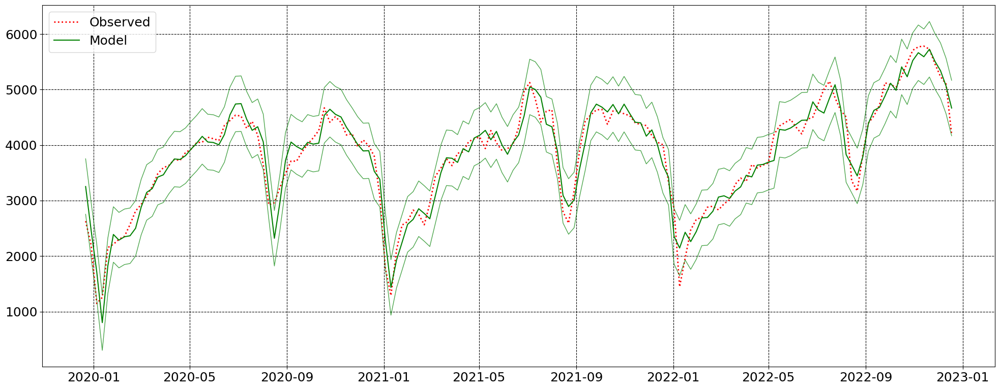

In [19]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_22._initial_level,initial_seasonal=model_22._initial_seasonal,initial_trend=model_22._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2023.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

In [20]:
#2022 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald23_ts=artikel_ts[start:start+52*end_int+2]
print(vald23_ts)
# print(vald22_ts[-53:-49])


2019-12-29    2193.0
2020-01-05    1146.0
2020-01-12    1255.0
2020-01-19    2153.0
2020-01-26    2213.0
               ...  
2022-12-04    5235.0
2022-12-11    5101.0
2022-12-18    4196.0
2022-12-25    4054.0
2023-01-01    3038.0
Name: Net_week_art, Length: 158, dtype: float64


Saving done


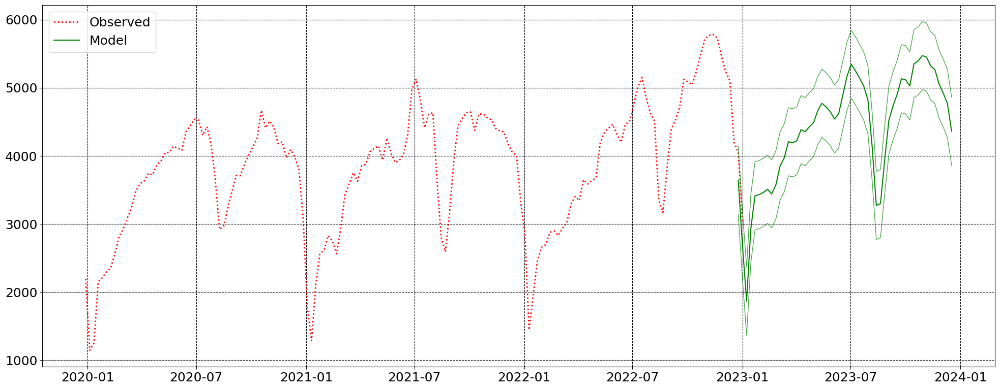

In [22]:
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()

mod_net=pd.concat([mod_result.fittedvalues,forecast_2023])

fname=os.path.join(artikel_data_loc,'Forecast23.jpg')
ff.plot_mod_obs(vald23_ts,forecast_2023,resid,fname)
fname='Forecast_2023.csv'
ff.create_fcast_csv(forecast_2023,resid,fname,artikel_data_loc)

## **TB80120G**

*Note* taking 5 years

In [12]:

importlib.reload(ff)
region='All Locations'
artikel_code='TB80120G'
ini_start_year_train=2015
end_year_train=2019
artikel_ts,train_ts=ff.get_data_series(region,artikel_code,dirname,ini_start_year_train,end_year_train)
# print('Training series is:'+str(train_ts))
train_ts=train_ts[2:]
print('Training series is:'+str(train_ts))

Training series is:2014-12-28     860.0
2015-01-04     407.0
2015-01-11     391.0
2015-01-18     630.0
2015-01-25     746.0
               ...  
2019-12-01    2842.0
2019-12-08    2732.0
2019-12-15    2219.0
2019-12-22    1836.0
2019-12-29    1595.0
Name: Net_week_art, Length: 262, dtype: float64


### ***Model Developement and Validation***

Note that some time one needs to adjust the training time seires to have a correct prediction start.

#### Time series analysis

Now we plot a Auto correlation of the time series to see whether it correlates to a yearly data.

0.9671732550033163
0.3321133607361701
0.8885592731249609
0.88774539586268
0.8301563918838727


<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

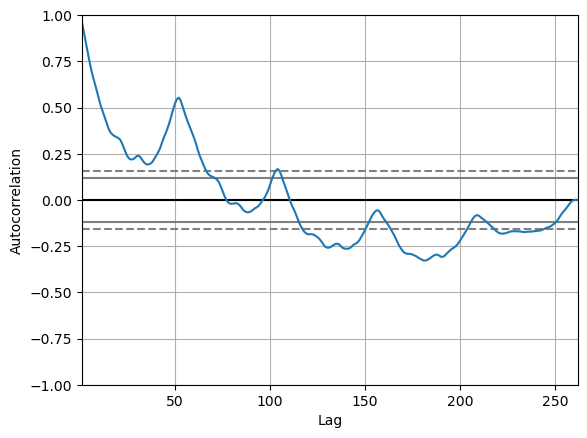

In [13]:
# lags based on weeks
lagvec=[1,25,52,52*2,int(52*4)]
for lag in lagvec:
    x=train_ts.autocorr(lag=lag)
    print(x)
pd.plotting.autocorrelation_plot(train_ts)

Seems like the series has a nice correlation for a year data (around 52 weeks) and also 26 weeks. The correlation goes down for 2 or larger years. 

#### Decomposing the series

The series can be decomposed into trend, sesonality and residual.

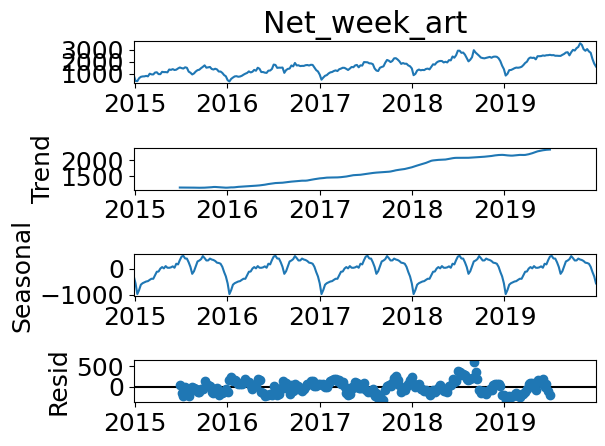

In [20]:
import statsmodels.api as sm
result=sm.tsa.seasonal_decompose(train_ts,model='add',period=52*1)

# plt.figure*()
fig1=result.plot()
fig1.tight_layout()
#resid=

resid=250


There is clearly an increasing trend which migh plateau in 2020. Importantly the seasonality pattern suggests that there are definite times in the year when certain orders are placed. 

**Important**

The residual (resid) gives a hint that these are spurious orders over the years which have will be difficult to be captured by the prediction algorithm. Thus, we can say that the uncertainty in our prediction would be around the max of this residual i.e. *250*


#### Model

In [21]:
model_20=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_20.fit()#location
artikel_data_loc=os.path.join(forecast_data,region,artikel_code)
summary_loc=os.path.join(artikel_data_loc,'model_summary.data')
with open(summary_loc,'w') as f:
    f.write(str(mod_result.summary()))

print(mod_result.summary())

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  262
Model:             ExponentialSmoothing   SSE                        2971228.344
Optimized:                         True   AIC                           2560.069
Trend:                         Additive   BIC                           2763.465
Seasonal:                Multiplicative   AICC                          2595.119
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         11:12:01
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9596411                alpha                 True
smoothing_trend          

Testing for the fitting of model versus observed data.

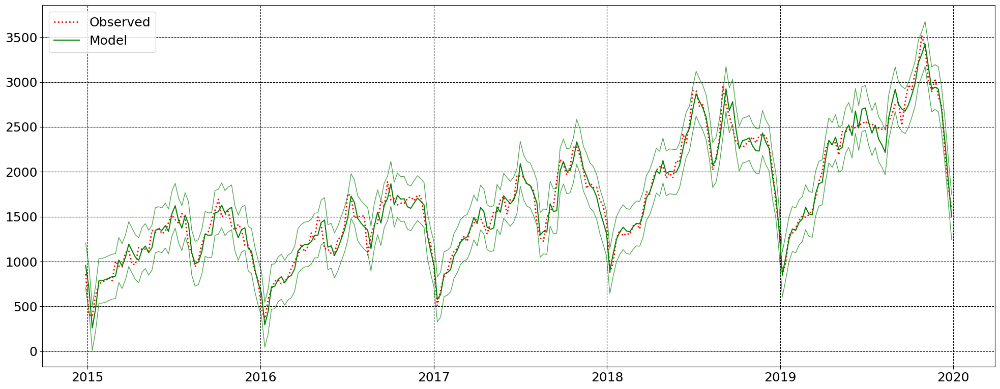

In [22]:
importlib.reload(ff)
fname=os.path.join(artikel_data_loc,'Testing_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)


Testing for forecasting on 2020.

In [23]:
#2020 observations ts
start_year_train=ini_start_year_train
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
vald_ts=artikel_ts[start:start+52*end_int+1]
print(vald_ts)
print(vald_ts[-53:-49])
#take initial 1521 at week 1

2015-01-04     407.0
2015-01-11     391.0
2015-01-18     630.0
2015-01-25     746.0
2015-02-01     778.0
               ...  
2020-11-29    3142.0
2020-12-06    3183.0
2020-12-13    3129.0
2020-12-20    3008.0
2020-12-27    2536.0
Name: Net_week_art, Length: 313, dtype: float64
2019-12-29    1595.0
2020-01-05    1011.0
2020-01-12    1100.0
2020-01-19    1602.0
Name: Net_week_art, dtype: float64


Saving done


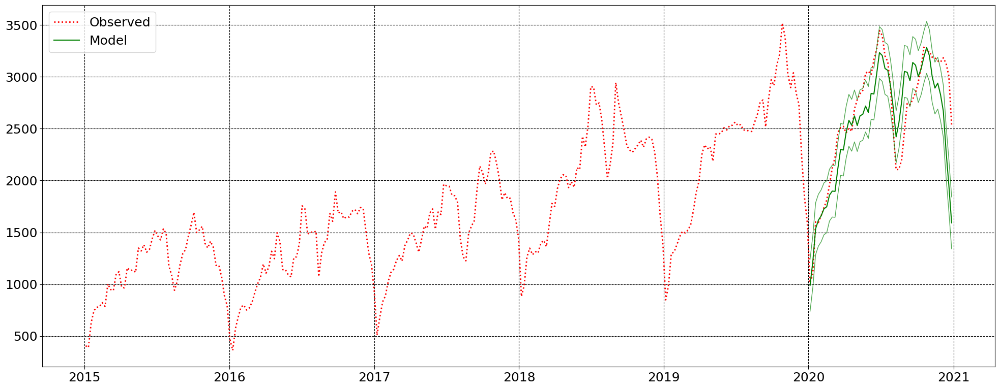

In [24]:
importlib.reload(ff)
forecast_2020=mod_result.forecast(52)

mod_net=pd.concat([mod_result.fittedvalues,forecast_2020])
fname=os.path.join(artikel_data_loc,'Testing_Forecast_2020.jpg')
ff.plot_mod_obs(vald_ts,forecast_2020,resid,fname)
fname='Forecast_2020.csv'
ff.create_fcast_csv(forecast_2020,resid,fname,artikel_data_loc)

### Validation

(Corona Effect)

Now the train_ts is replaced by the validation ts and a 2021 forecast is made

In [43]:
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts)

2016-01-03     468.0
2016-01-10     363.0
2016-01-17     576.0
2016-01-24     687.0
2016-01-31     782.0
               ...  
2020-11-29    3142.0
2020-12-06    3183.0
2020-12-13    3129.0
2020-12-20    3008.0
2020-12-27    2536.0
Name: Net_week_art, Length: 261, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  261
Model:             ExponentialSmoothing   SSE                        3295360.603
Optimized:                         True   AIC                           2578.755
Trend:                         Additive   BIC                           2781.933
Seasonal:                      Additive   AICC                          2613.979
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         11:18:17
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9655784                alpha                 True
smoothing_trend          

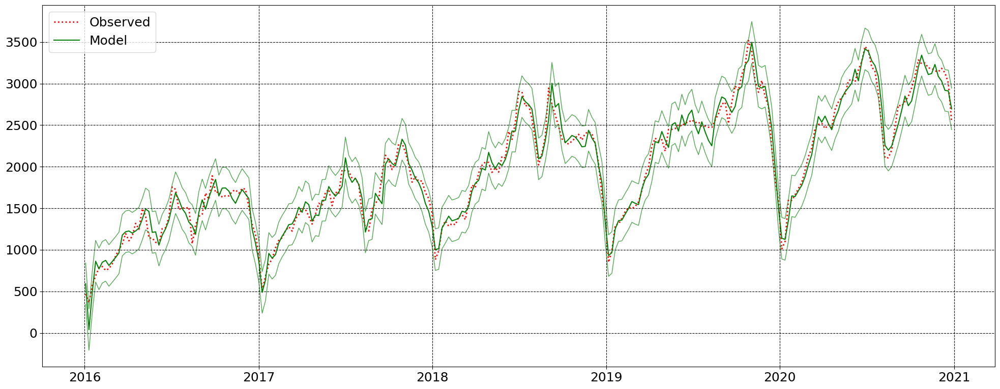

In [44]:
# model_21=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
model_21=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='add',seasonal_periods=52*1,initialization_method='estimated')

mod_result=model_21.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

*Forecast for 2021*

In [45]:
#2021 observations ts
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
vald21_ts=artikel_ts[start:start+52*end_int+2]
print(vald21_ts)
# print(vald21_ts[-53:-49])

2016-01-03     468.0
2016-01-10     363.0
2016-01-17     576.0
2016-01-24     687.0
2016-01-31     782.0
               ...  
2021-12-05    3361.0
2021-12-12    3345.0
2021-12-19    3298.0
2021-12-26    3080.0
2022-01-02    2656.0
Name: Net_week_art, Length: 314, dtype: float64


Plotting against observed

Saving done


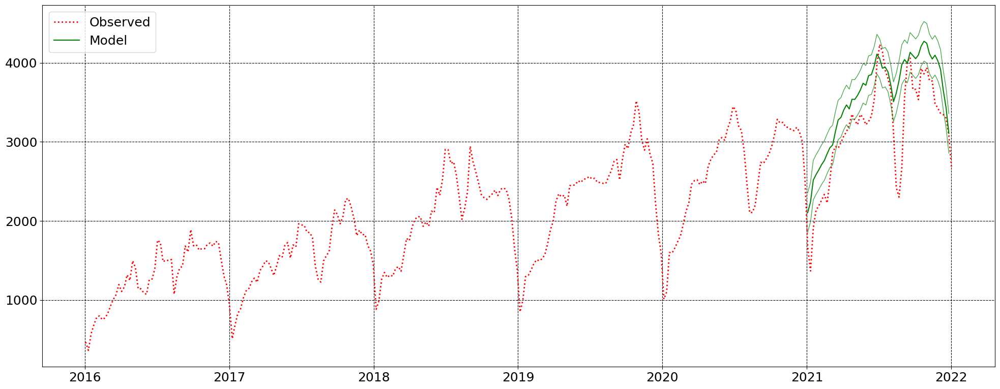

In [46]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()

fname=os.path.join(artikel_data_loc,'Validation_forecastt_2021.jpg')
ff.plot_mod_obs(vald21_ts,forecast_2021,resid,fname)
fname='Forecast_2021.csv'
ff.create_fcast_csv(forecast_2021,resid,fname,artikel_data_loc)

### Forecast 2022

Train data till 2021


In [47]:
#2022 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2017-01-08     511.0
2017-01-15     684.0
2017-01-22     830.0
2017-01-29     888.0
2017-02-05    1025.0
               ...  
2021-11-28    3428.0
2021-12-05    3361.0
2021-12-12    3345.0
2021-12-19    3298.0
2021-12-26    3080.0
Name: Net_week_art, Length: 260, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  261
Model:             ExponentialSmoothing   SSE                        4707311.503
Optimized:                         True   AIC                           2671.828
Trend:                         Additive   BIC                           2875.006
Seasonal:                Multiplicative   AICC                          2707.052
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         11:18:34
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9949993                alpha                 True
smoothing_trend          

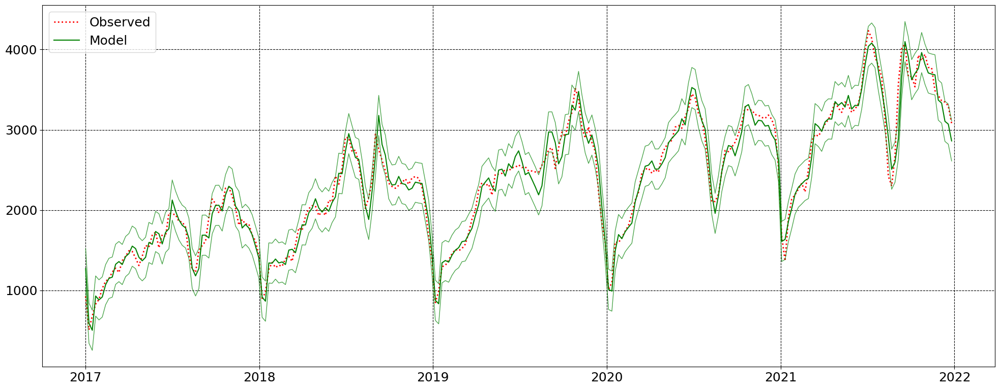

In [48]:
# model_22=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_21._initial_level,initial_seasonal=model_21._initial_seasonal,initial_trend=model_21._initial_trend)
model_22=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_22.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2022.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

In [49]:
#2021 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald22_ts=artikel_ts[start:start+52*end_int+2]
print(vald22_ts)
# print(vald22_ts[-53:-49])


2017-01-01     927.0
2017-01-08     511.0
2017-01-15     684.0
2017-01-22     830.0
2017-01-29     888.0
               ...  
2022-12-04    3791.0
2022-12-11    3661.0
2022-12-18    2983.0
2022-12-25    2802.0
2023-01-01    2104.0
Name: Net_week_art, Length: 314, dtype: float64


Saving done


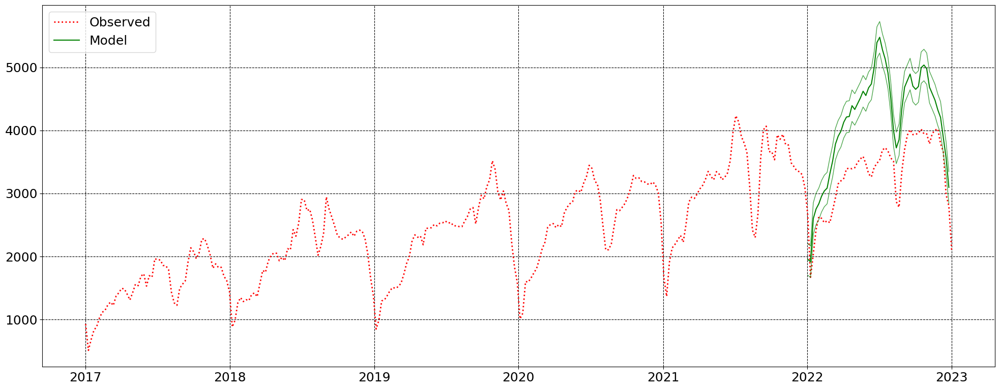

In [50]:
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()
#since the forecast depends on the starting value
# forecast_2022=forecast_2022-1920
mod_net=pd.concat([mod_result.fittedvalues,forecast_2022])
#2021 forecast time series
fname=os.path.join(artikel_data_loc,'Forecast22.jpg')
ff.plot_mod_obs(vald22_ts,forecast_2022,resid,fname)
fname='Forecast_2022.csv'
ff.create_fcast_csv(forecast_2022,resid,fname,artikel_data_loc)

### Forecast 2023

Train data till 2022


In [51]:
#2023 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52-1)
end_int=int(2023-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2017-12-31    1439.0
2018-01-07     882.0
2018-01-14     988.0
2018-01-21    1263.0
2018-01-28    1348.0
               ...  
2022-11-20    4005.0
2022-11-27    4025.0
2022-12-04    3791.0
2022-12-11    3661.0
2022-12-18    2983.0
Name: Net_week_art, Length: 260, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  261
Model:             ExponentialSmoothing   SSE                       10943448.344
Optimized:                         True   AIC                           2892.014
Trend:                         Additive   BIC                           3095.191
Seasonal:                Multiplicative   AICC                          2927.238
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         11:20:17
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.5353570                alpha                 True
smoothing_trend          

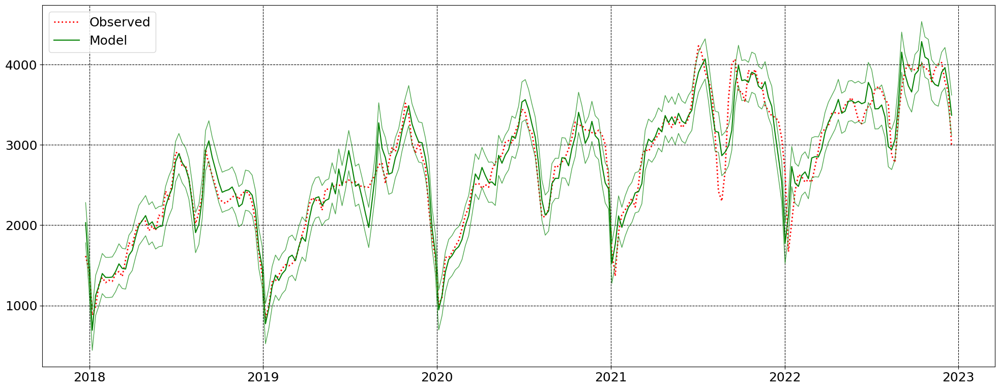

In [52]:
model_23=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_22._initial_level,initial_seasonal=model_22._initial_seasonal,initial_trend=model_22._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_23.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2023.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

In [53]:
#2022 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald23_ts=artikel_ts[start:start+52*end_int+2]
print(vald23_ts)
# print(vald22_ts[-53:-49])


2017-12-31    1439.0
2018-01-07     882.0
2018-01-14     988.0
2018-01-21    1263.0
2018-01-28    1348.0
               ...  
2022-12-04    3791.0
2022-12-11    3661.0
2022-12-18    2983.0
2022-12-25    2802.0
2023-01-01    2104.0
Name: Net_week_art, Length: 262, dtype: float64


Saving done


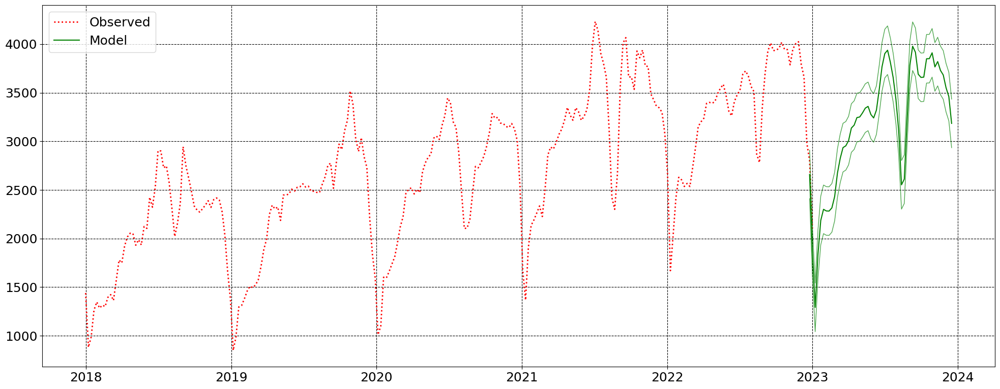

In [54]:
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()

mod_net=pd.concat([mod_result.fittedvalues,forecast_2023])

fname=os.path.join(artikel_data_loc,'Forecast23.jpg')
ff.plot_mod_obs(vald23_ts,forecast_2023,resid,fname)
fname='Forecast_2023.csv'
ff.create_fcast_csv(forecast_2023,resid,fname,artikel_data_loc)

## **A01-80-(30)**

In [4]:

importlib.reload(ff)
region='All Locations'
artikel_code='A01-80-(30)'
ini_start_year_train=2015
end_year_train=2019
artikel_ts,train_ts=ff.get_data_series(region,artikel_code,dirname,ini_start_year_train,end_year_train)
# print('Training series is:'+str(train_ts))
train_ts=train_ts[2:]
print('Training series is:'+str(train_ts))

Training series is:2014-12-28     611.0
2015-01-04     341.0
2015-01-11     251.0
2015-01-18     348.0
2015-01-25     467.0
               ...  
2019-12-01    1714.0
2019-12-08    1733.0
2019-12-15    1621.0
2019-12-22    1391.0
2019-12-29    1195.0
Name: Net_week_art, Length: 262, dtype: float64


### ***Model Developement and Validation***

Note that some time one needs to adjust the training time seires to have a correct prediction start.

#### Time series analysis

Now we plot a Auto correlation of the time series to see whether it correlates to a yearly data.

0.9573645963093614
0.4916587911066872
0.7976613203336544
0.7032128316088309
0.712178653502752


<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

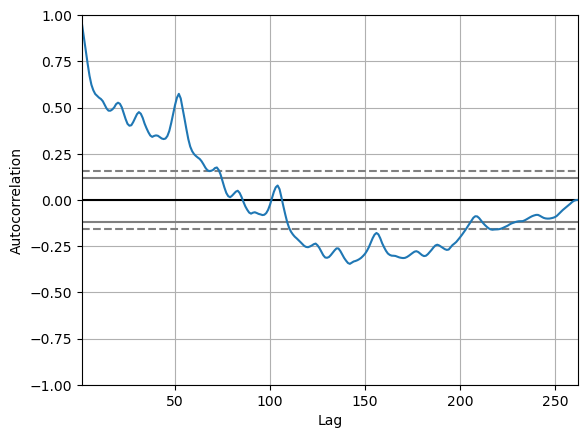

In [6]:
# lags based on weeks
lagvec=[1,25,52,52*2,int(52*3)]
for lag in lagvec:
    x=train_ts.autocorr(lag=lag)
    print(x)
pd.plotting.autocorrelation_plot(train_ts)

Seems like the series has a nice correlation for a year data (around 52 weeks) and also 26 weeks. The correlation goes down for 2 or larger years. 

#### Decomposing the series

The series can be decomposed into trend, sesonality and residual.

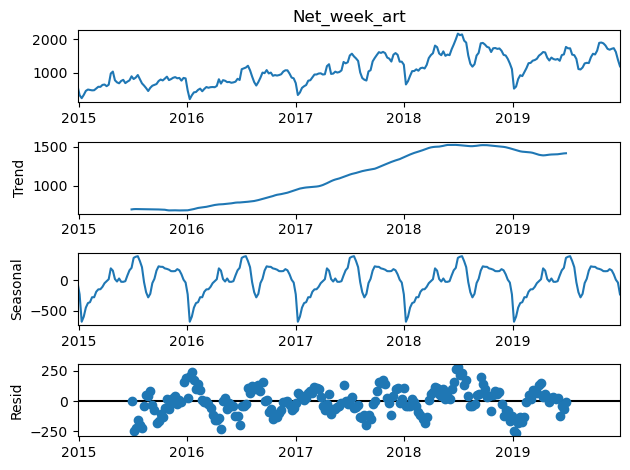

In [8]:
import statsmodels.api as sm
result=sm.tsa.seasonal_decompose(train_ts,model='add',period=52*1)

# plt.figure*()
fig1=result.plot()
fig1.tight_layout()
#based on below figure
resid=250

There is clearly an increasing trend which migh plateau in 2020. Importantly the seasonality pattern suggests that there are definite times in the year when certain orders are placed. 

**Important**

The residual (resid) gives a hint that these are spurious orders over the years which have will be difficult to be captured by the prediction algorithm. Thus, we can say that the uncertainty in our prediction would be around the max of this residual i.e. *250*


#### Model

In [9]:
model_20=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_20.fit()#location
artikel_data_loc=os.path.join(forecast_data,region,artikel_code)
summary_loc=os.path.join(artikel_data_loc,'model_summary.data')
with open(summary_loc,'w') as f:
    f.write(str(mod_result.summary()))

print(mod_result.summary())

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  262
Model:             ExponentialSmoothing   SSE                        1274559.858
Optimized:                         True   AIC                           2338.319
Trend:                         Additive   BIC                           2541.715
Seasonal:                Multiplicative   AICC                          2373.368
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         11:22:50
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.8535571                alpha                 True
smoothing_trend          

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Testing for the fitting of model versus observed data.

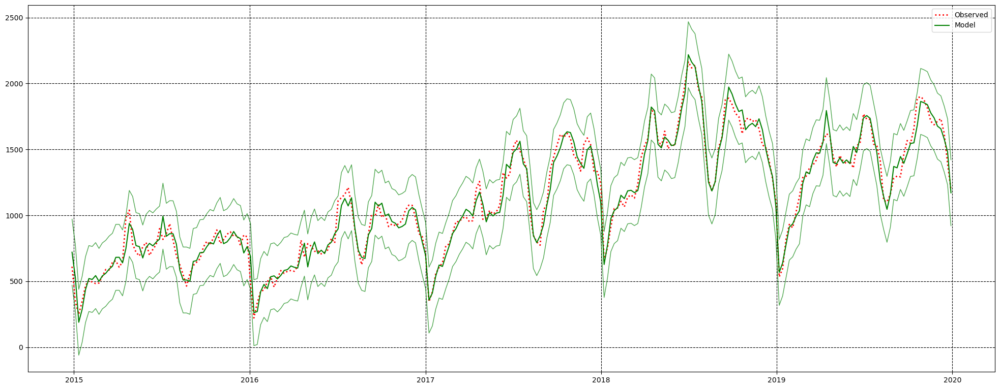

In [10]:
importlib.reload(ff)
fname=os.path.join(artikel_data_loc,'Testing_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)


Testing for forecasting on 2020.

In [11]:
#2020 observations ts
start_year_train=ini_start_year_train
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
vald_ts=artikel_ts[start:start+52*end_int+1]
print(vald_ts)
print(vald_ts[-53:-49])
#take initial 1521 at week 1

2015-01-04     341.0
2015-01-11     251.0
2015-01-18     348.0
2015-01-25     467.0
2015-02-01     507.0
               ...  
2020-11-29    1747.0
2020-12-06    1800.0
2020-12-13    1680.0
2020-12-20    1628.0
2020-12-27    1325.0
Name: Net_week_art, Length: 313, dtype: float64
2019-12-29    1195.0
2020-01-05     713.0
2020-01-12     552.0
2020-01-19     965.0
Name: Net_week_art, dtype: float64


Saving done


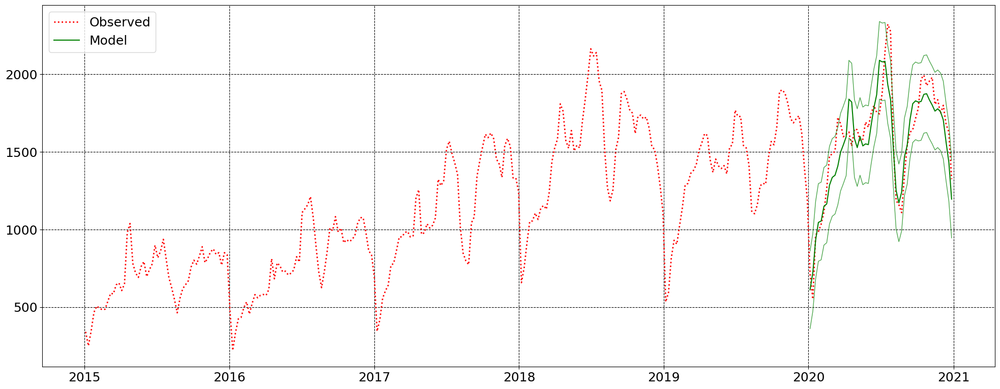

In [14]:
importlib.reload(ff)
forecast_2020=mod_result.forecast(52)
forecast_2020=forecast_2020.round()
mod_net=pd.concat([mod_result.fittedvalues,forecast_2020])
fname=os.path.join(artikel_data_loc,'Testing_Forecast_2020.jpg')
ff.plot_mod_obs(vald_ts,forecast_2020,resid,fname)
fname='Forecast_2020.csv'
ff.create_fcast_csv(forecast_2020,resid,fname,artikel_data_loc)

### Validation

(Corona Effect)

Now the train_ts is replaced by the validation ts and a 2021 forecast is made

In [15]:
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts)

2016-01-03     479.0
2016-01-10     222.0
2016-01-17     337.0
2016-01-24     424.0
2016-01-31     434.0
               ...  
2020-11-29    1747.0
2020-12-06    1800.0
2020-12-13    1680.0
2020-12-20    1628.0
2020-12-27    1325.0
Name: Net_week_art, Length: 261, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  261
Model:             ExponentialSmoothing   SSE                        2390432.090
Optimized:                         True   AIC                           2494.963
Trend:                         Additive   BIC                           2698.141
Seasonal:                Multiplicative   AICC                          2530.187
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         11:25:05
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.6767839                alpha                 True
smoothing_trend          

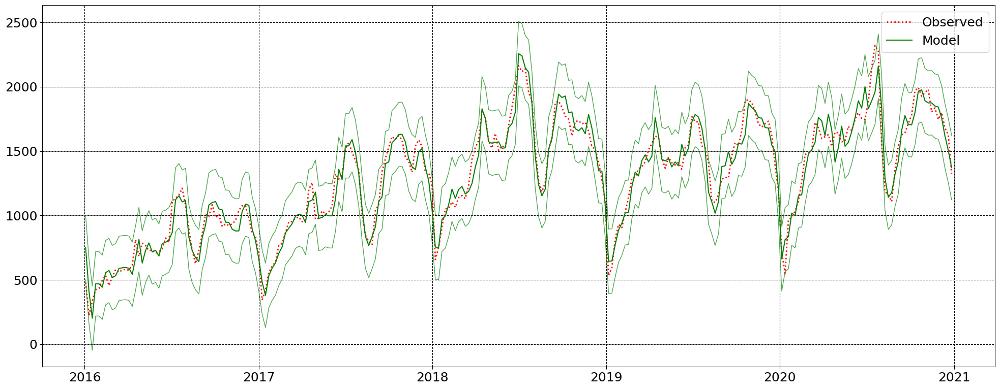

In [16]:
model_21=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')

mod_result=model_21.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

*Forecast for 2021*

In [17]:
#2021 observations ts
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
vald21_ts=artikel_ts[start:start+52*end_int+2]
print(vald21_ts)
print(vald21_ts[-53:-49])

2016-01-03     479.0
2016-01-10     222.0
2016-01-17     337.0
2016-01-24     424.0
2016-01-31     434.0
               ...  
2021-12-05    1999.0
2021-12-12    1963.0
2021-12-19    1939.0
2021-12-26    1904.0
2022-01-02    1548.0
Name: Net_week_art, Length: 314, dtype: float64
2021-01-03     784.0
2021-01-10     599.0
2021-01-17    1025.0
2021-01-24    1133.0
Name: Net_week_art, dtype: float64


Plotting against observed

Saving done


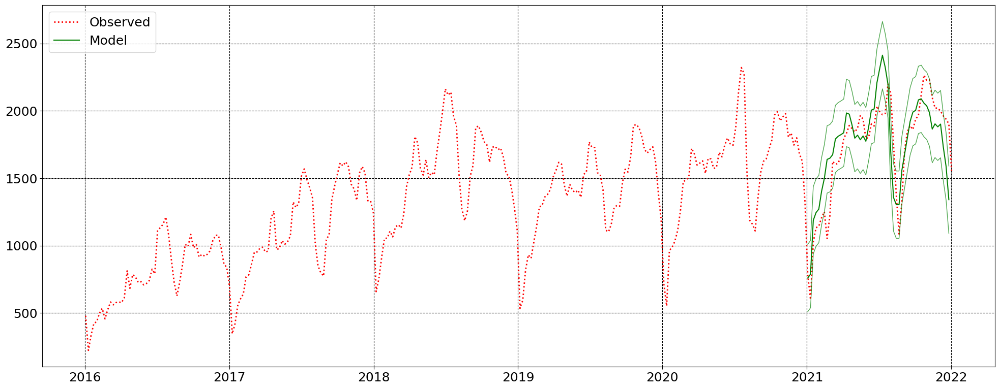

In [18]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()

fname=os.path.join(artikel_data_loc,'Validation_forecastt_2021.jpg')
ff.plot_mod_obs(vald21_ts,forecast_2021,resid,fname)
fname='Forecast_2021.csv'
ff.create_fcast_csv(forecast_2021,resid,fname,artikel_data_loc)

### Forecast 2022

Train data till 2021


In [19]:
#2022 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2017-01-08     345.0
2017-01-15     420.0
2017-01-22     557.0
2017-01-29     605.0
2017-02-05     641.0
               ...  
2021-11-28    2021.0
2021-12-05    1999.0
2021-12-12    1963.0
2021-12-19    1939.0
2021-12-26    1904.0
Name: Net_week_art, Length: 260, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  261
Model:             ExponentialSmoothing   SSE                        2337494.749
Optimized:                         True   AIC                           2489.118
Trend:                         Additive   BIC                           2692.296
Seasonal:                Multiplicative   AICC                          2524.342
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         11:29:49
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9949990                alpha                 True
smoothing_trend          

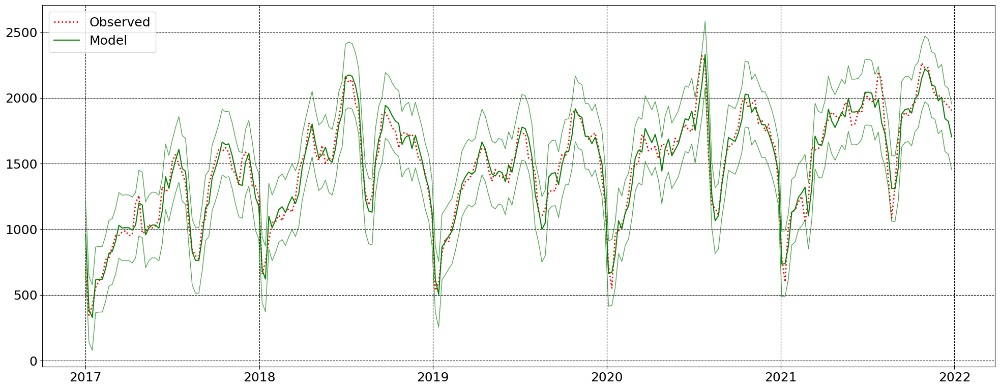

In [38]:
# model_22=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_21._initial_level,initial_seasonal=model_21._initial_seasonal,initial_trend=model_21._initial_trend)
model_22=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_22.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2022.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

In [39]:
#2021 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald22_ts=artikel_ts[start:start+52*end_int+2]
print(vald22_ts)
# print(vald22_ts[-53:-49])


2017-01-01     696.0
2017-01-08     345.0
2017-01-15     420.0
2017-01-22     557.0
2017-01-29     605.0
               ...  
2022-12-04    2285.0
2022-12-11    2208.0
2022-12-18    2323.0
2022-12-25    2096.0
2023-01-01    1618.0
Name: Net_week_art, Length: 314, dtype: float64


Saving done


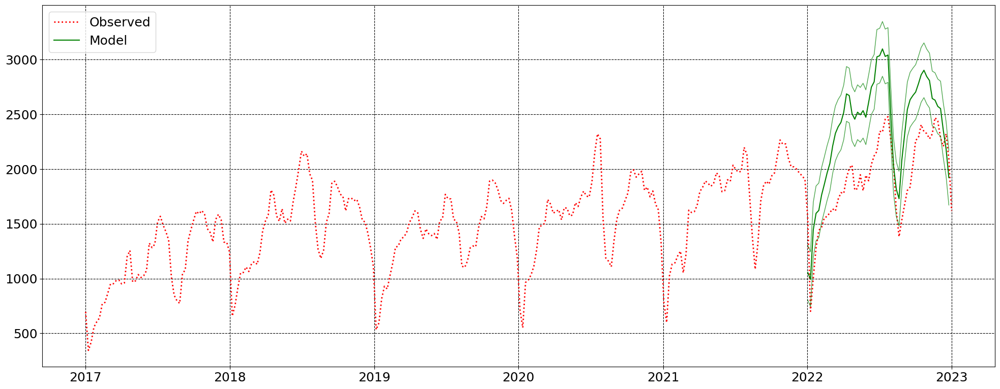

In [40]:
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()


#2021 forecast time series
fname=os.path.join(artikel_data_loc,'Forecast22.jpg')
ff.plot_mod_obs(vald22_ts,forecast_2022,resid,fname)
fname='Forecast_2022.csv'
ff.create_fcast_csv(forecast_2022,resid,fname,artikel_data_loc)

### Forecast 2023

Train data till 2022


In [42]:
#2023 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52-1)
end_int=int(2023-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2017-12-31    1243.0
2018-01-07     658.0
2018-01-14     755.0
2018-01-21     913.0
2018-01-28    1052.0
               ...  
2022-11-20    2470.0
2022-11-27    2440.0
2022-12-04    2285.0
2022-12-11    2208.0
2022-12-18    2323.0
Name: Net_week_art, Length: 260, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  261
Model:             ExponentialSmoothing   SSE                        5667003.081
Optimized:                         True   AIC                           2720.255
Trend:                         Additive   BIC                           2923.432
Seasonal:                Multiplicative   AICC                          2755.479
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         11:30:57
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.2171440                alpha                 True
smoothing_trend          

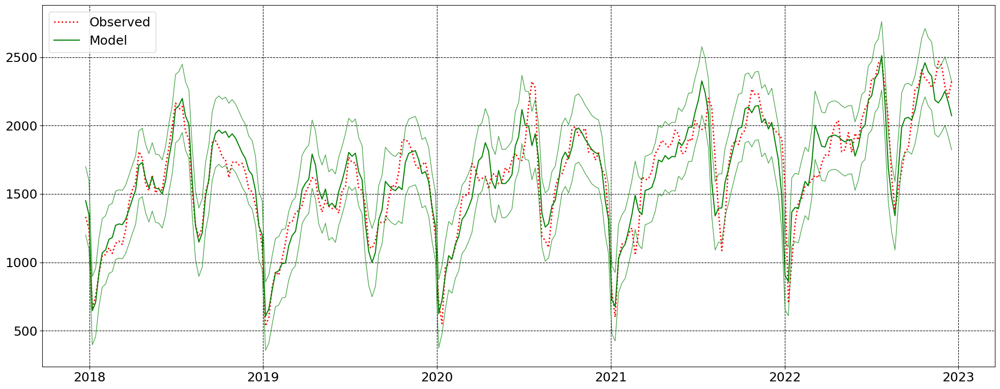

In [44]:
model_23=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_22._initial_level,initial_seasonal=model_22._initial_seasonal,initial_trend=model_22._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_23.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2023.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

In [45]:
#2022 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald23_ts=artikel_ts[start:start+52*end_int+2]
print(vald23_ts)
# print(vald22_ts[-53:-49])


2017-12-31    1243.0
2018-01-07     658.0
2018-01-14     755.0
2018-01-21     913.0
2018-01-28    1052.0
               ...  
2022-12-04    2285.0
2022-12-11    2208.0
2022-12-18    2323.0
2022-12-25    2096.0
2023-01-01    1618.0
Name: Net_week_art, Length: 262, dtype: float64


Saving done


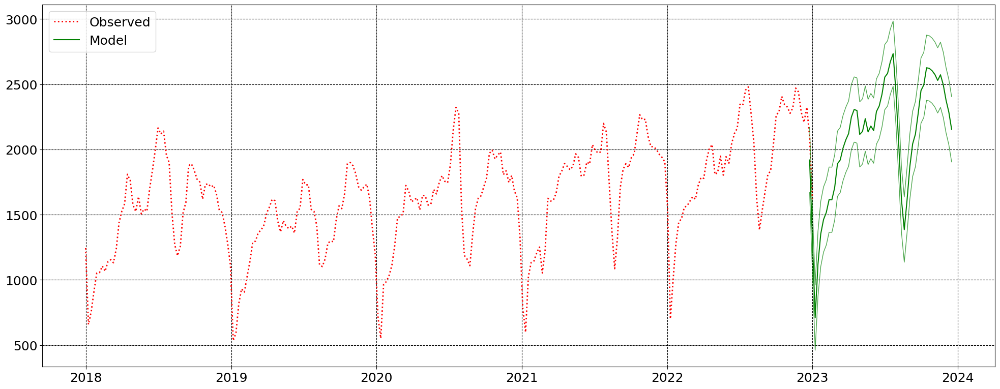

In [46]:
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()

mod_net=pd.concat([mod_result.fittedvalues,forecast_2023])

fname=os.path.join(artikel_data_loc,'Forecast23.jpg')
ff.plot_mod_obs(vald23_ts,forecast_2023,resid,fname)
fname='Forecast_2023.csv'
ff.create_fcast_csv(forecast_2023,resid,fname,artikel_data_loc)

## **C02-80**

In [49]:

importlib.reload(ff)
region='All Locations'
artikel_code='C02-80'
ini_start_year_train=2015
end_year_train=2019
artikel_ts,train_ts=ff.get_data_series(region,artikel_code,dirname,ini_start_year_train,end_year_train)
# print('Training series is:'+str(train_ts))
train_ts=train_ts[2:]
print('Training series is:'+str(train_ts))

Training series is:2014-12-28     70.0
2015-01-04     39.0
2015-01-11     39.0
2015-01-18     51.0
2015-01-25     58.0
              ...  
2019-12-01    136.0
2019-12-08    132.0
2019-12-15    136.0
2019-12-22    130.0
2019-12-29    126.0
Name: Net_week_art, Length: 262, dtype: float64


### ***Model Developement and Validation***

Note that some time one needs to adjust the training time seires to have a correct prediction start.

#### Time series analysis

Now we plot a Auto correlation of the time series to see whether it correlates to a yearly data.

0.9511508681113845
0.501105771837082
0.756435489972591
0.6121312913222554
0.6050911997567401


<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

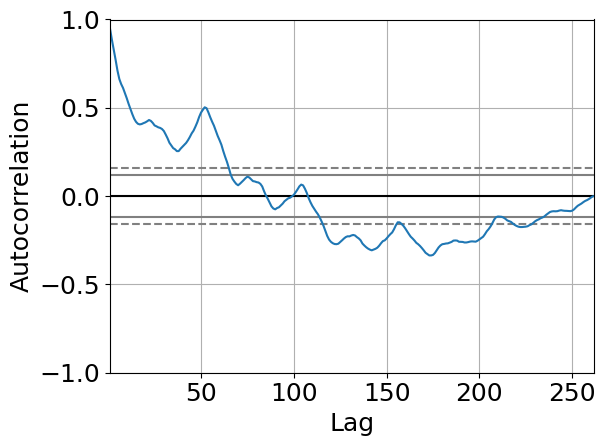

In [51]:
# lags based on weeks
lagvec=[1,25,52,52*2,int(52*3)]
for lag in lagvec:
    x=train_ts.autocorr(lag=lag)
    print(x)
pd.plotting.autocorrelation_plot(train_ts)

Seems like the series has a nice correlation for a year data (around 52 weeks) and also 26 weeks. The correlation goes down for 2 or larger years. 

#### Decomposing the series

The series can be decomposed into trend, sesonality and residual.

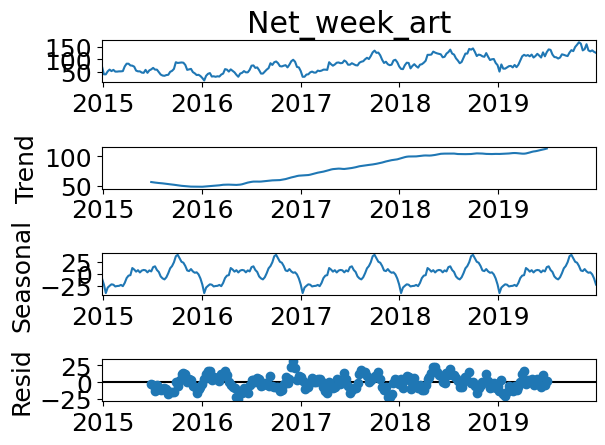

In [53]:

import statsmodels.api as sm
result=sm.tsa.seasonal_decompose(train_ts,model='add',period=52*1)

# plt.figure*()
fig1=result.plot()
fig1.tight_layout()
resid=25

There is clearly an increasing trend which migh plateau in 2020. Importantly the seasonality pattern suggests that there are definite times in the year when certain orders are placed. 

**Important**

The residual (resid) gives a hint that these are spurious orders over the years which have will be difficult to be captured by the prediction algorithm. Thus, we can say that the uncertainty in our prediction would be around the max of this residual i.e. *250*


#### Model

In [54]:
model_20=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_20.fit()#location
# mod_result=model_20.fit(remove_bias=True)
artikel_data_loc=os.path.join(forecast_data,region,artikel_code)
summary_loc=os.path.join(artikel_data_loc,'model_summary.data')
with open(summary_loc,'w') as f:
    f.write(str(mod_result.summary()))

print(mod_result.summary())

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  262
Model:             ExponentialSmoothing   SSE                          17053.277
Optimized:                         True   AIC                           1208.047
Trend:                         Additive   BIC                           1411.443
Seasonal:                Multiplicative   AICC                          1243.097
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         11:36:22
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9354616                alpha                 True
smoothing_trend          

Testing for the fitting of model versus observed data.

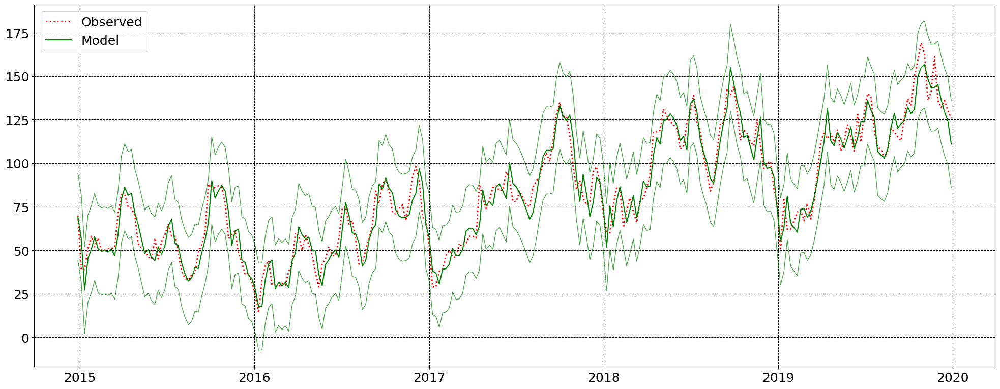

In [55]:
importlib.reload(ff)
fname=os.path.join(artikel_data_loc,'Testing_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)


Testing for forecasting on 2020.

In [56]:
#2020 observations ts
start_year_train=ini_start_year_train
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
vald_ts=artikel_ts[start:start+52*end_int+1]
print(vald_ts)
print(vald_ts[-53:-49])
#take initial 1521 at week 1

2015-01-04     39.0
2015-01-11     39.0
2015-01-18     51.0
2015-01-25     58.0
2015-02-01     52.0
              ...  
2020-11-29    177.0
2020-12-06    161.0
2020-12-13    164.0
2020-12-20    143.0
2020-12-27    135.0
Name: Net_week_art, Length: 313, dtype: float64
2019-12-29    126.0
2020-01-05     88.0
2020-01-12     74.0
2020-01-19    104.0
Name: Net_week_art, dtype: float64


Saving done


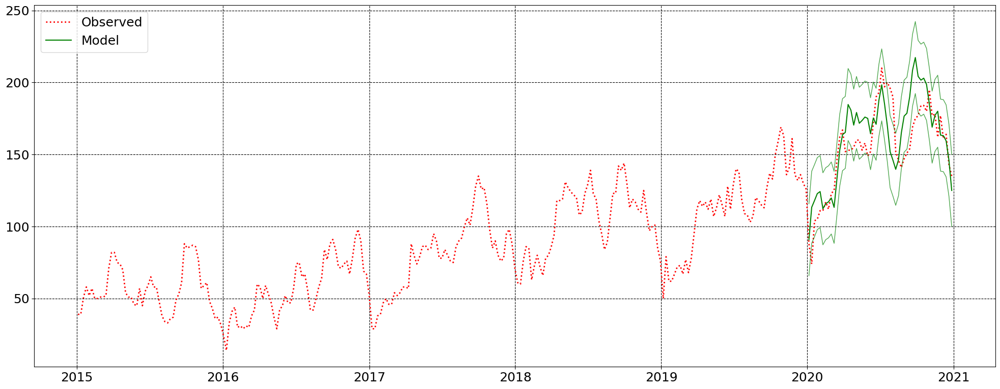

In [57]:
importlib.reload(ff)
forecast_2020=mod_result.forecast(52)

mod_net=pd.concat([mod_result.fittedvalues,forecast_2020])
fname=os.path.join(artikel_data_loc,'Testing_Forecast_2020.jpg')

ff.plot_mod_obs(vald_ts,forecast_2020,resid,fname)
fname='Forecast_2020.csv'
ff.create_fcast_csv(forecast_2020,resid,fname,artikel_data_loc)

### Validation

(Corona Effect)

Now the train_ts is replaced by the validation ts and a 2021 forecast is made

In [63]:
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts)

2016-01-03     24.0
2016-01-10     14.0
2016-01-17     33.0
2016-01-24     41.0
2016-01-31     44.0
              ...  
2020-11-29    177.0
2020-12-06    161.0
2020-12-13    164.0
2020-12-20    143.0
2020-12-27    135.0
Name: Net_week_art, Length: 261, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  261
Model:             ExponentialSmoothing   SSE                          19282.777
Optimized:                         True   AIC                           1236.939
Trend:                         Additive   BIC                           1440.116
Seasonal:                Multiplicative   AICC                          1272.163
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         11:39:40
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9053754                alpha                 True
smoothing_trend          

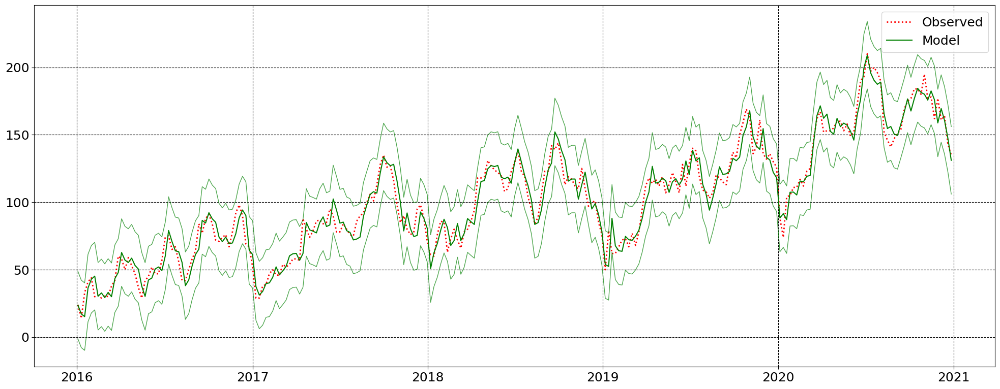

In [70]:
# model_21=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
model_21=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')

mod_result=model_21.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

*Forecast for 2021*

In [71]:
#2021 observations ts
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
vald21_ts=artikel_ts[start:start+52*end_int+2]
print(vald21_ts)
# print(vald21_ts[-53:-49])

2016-01-03     24.0
2016-01-10     14.0
2016-01-17     33.0
2016-01-24     41.0
2016-01-31     44.0
              ...  
2021-12-05    139.0
2021-12-12    132.0
2021-12-19    136.0
2021-12-26    127.0
2022-01-02    114.0
Name: Net_week_art, Length: 314, dtype: float64


Plotting against observed

Saving done


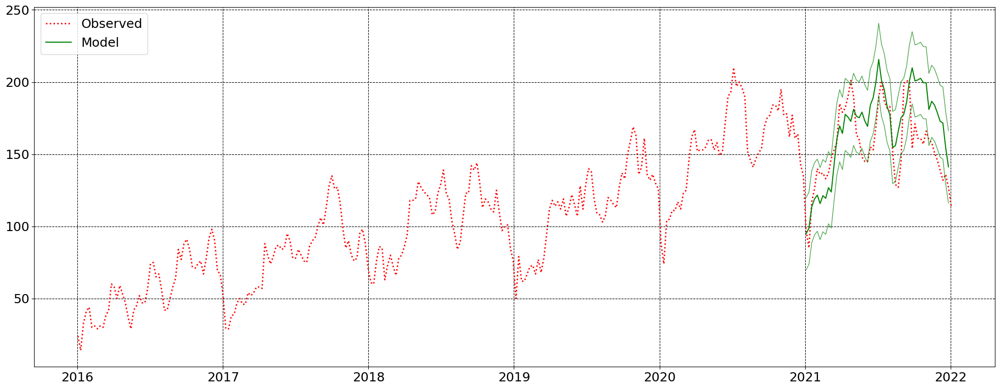

In [72]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)

fname=os.path.join(artikel_data_loc,'Validation_forecastt_2021.jpg')
ff.plot_mod_obs(vald21_ts,forecast_2021,resid,fname)
fname='Forecast_2021.csv'
ff.create_fcast_csv(forecast_2021,resid,fname,artikel_data_loc)

### Forecast 2022

Train data till 2021


In [73]:
#2022 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2017-01-08     29.0
2017-01-15     29.0
2017-01-22     38.0
2017-01-29     39.0
2017-02-05     47.0
              ...  
2021-11-28    146.0
2021-12-05    139.0
2021-12-12    132.0
2021-12-19    136.0
2021-12-26    127.0
Name: Net_week_art, Length: 260, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  261
Model:             ExponentialSmoothing   SSE                          23955.602
Optimized:                         True   AIC                           1293.573
Trend:                         Additive   BIC                           1496.751
Seasonal:                Multiplicative   AICC                          1328.797
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         11:41:37
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.8802837                alpha                 True
smoothing_trend          

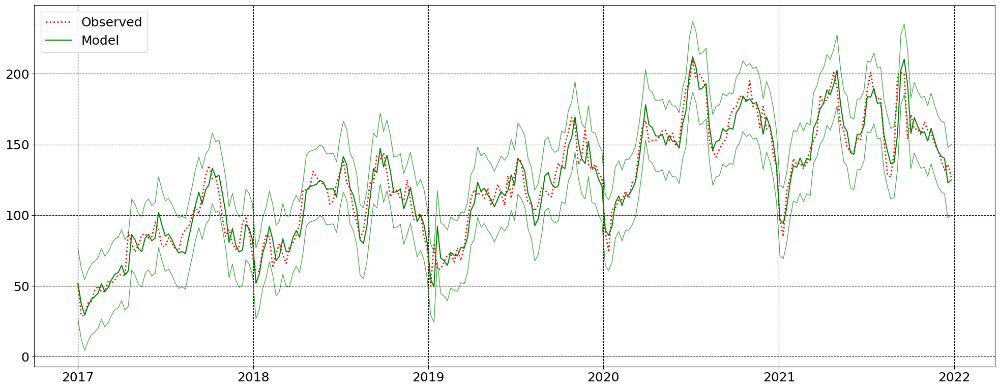

In [80]:
model_22=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_21._initial_level,initial_seasonal=model_21._initial_seasonal,initial_trend=model_21._initial_trend)
# model_22=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_22.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2022.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

In [81]:
#2021 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald22_ts=artikel_ts[start:start+52*end_int+2]
print(vald22_ts)
# print(vald22_ts[-53:-49])


2017-01-01     52.0
2017-01-08     29.0
2017-01-15     29.0
2017-01-22     38.0
2017-01-29     39.0
              ...  
2022-12-04    145.0
2022-12-11    135.0
2022-12-18    135.0
2022-12-25    121.0
2023-01-01     94.0
Name: Net_week_art, Length: 314, dtype: float64


Saving done


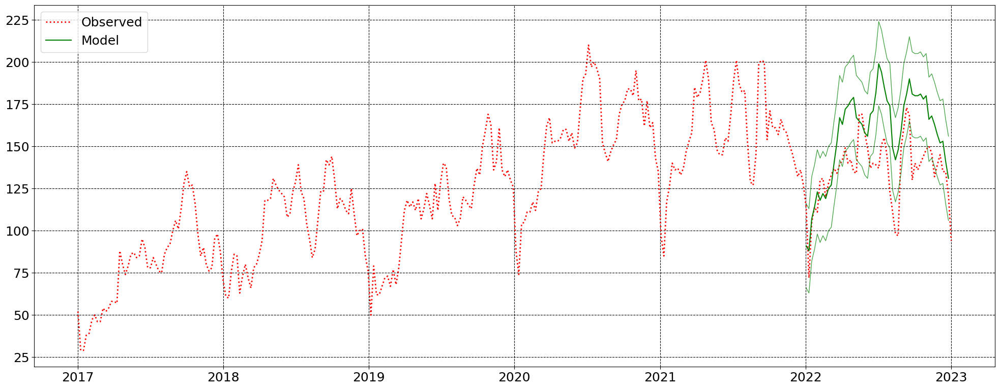

In [82]:
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()

fname=os.path.join(artikel_data_loc,'Forecast22.jpg')
ff.plot_mod_obs(vald22_ts,forecast_2022,resid,fname)
fname='Forecast_2022.csv'
ff.create_fcast_csv(forecast_2022,resid,fname,artikel_data_loc)

### Forecast 2023

Train data till 2022


In [83]:
#2023 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52-1)
end_int=int(2023-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2017-12-31     71.0
2018-01-07     61.0
2018-01-14     60.0
2018-01-21     76.0
2018-01-28     86.0
              ...  
2022-11-20    132.0
2022-11-27    139.0
2022-12-04    145.0
2022-12-11    135.0
2022-12-18    135.0
Name: Net_week_art, Length: 260, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  261
Model:             ExponentialSmoothing   SSE                          27688.351
Optimized:                         True   AIC                           1331.368
Trend:                         Additive   BIC                           1534.546
Seasonal:                Multiplicative   AICC                          1366.592
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         11:42:39
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.8038366                alpha                 True
smoothing_trend          

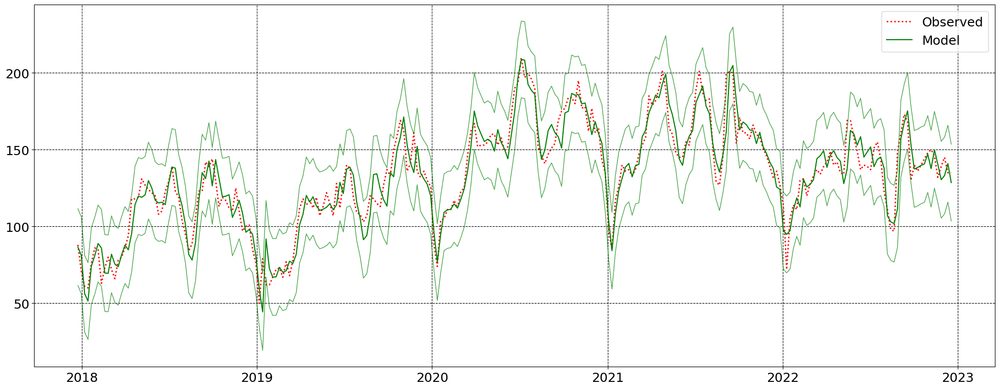

In [84]:
model_23=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_22._initial_level,initial_seasonal=model_22._initial_seasonal,initial_trend=model_22._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='add',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_23.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2023.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

In [85]:
#2022 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald23_ts=artikel_ts[start:start+52*end_int+2]
print(vald23_ts)
# print(vald22_ts[-53:-49])


2017-12-31     71.0
2018-01-07     61.0
2018-01-14     60.0
2018-01-21     76.0
2018-01-28     86.0
              ...  
2022-12-04    145.0
2022-12-11    135.0
2022-12-18    135.0
2022-12-25    121.0
2023-01-01     94.0
Name: Net_week_art, Length: 262, dtype: float64


Saving done


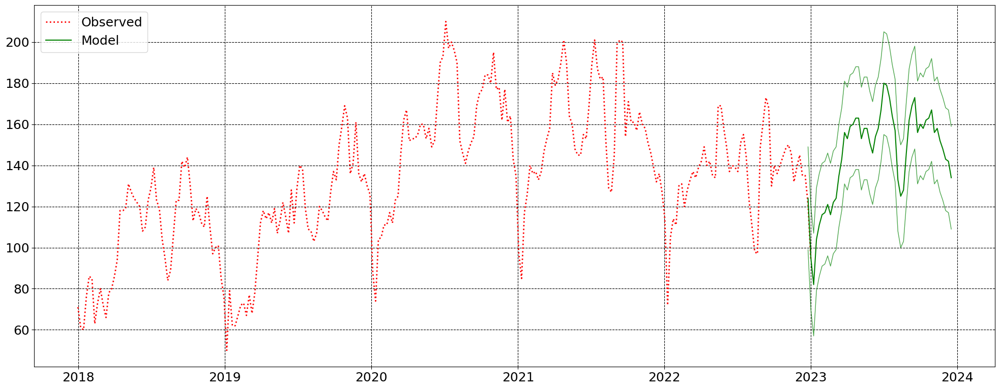

In [86]:
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()

mod_net=pd.concat([mod_result.fittedvalues,forecast_2023])

fname=os.path.join(artikel_data_loc,'Forecast23.jpg')
ff.plot_mod_obs(vald23_ts,forecast_2023,resid,fname)
fname='Forecast_2023.csv'
ff.create_fcast_csv(forecast_2023,resid,fname,artikel_data_loc)

## **BAAK**

In [45]:

importlib.reload(ff)
region='All Locations'
artikel_code='BAAK'
ini_start_year_train=2015
end_year_train=2019
artikel_ts,train_ts=ff.get_data_series(region,artikel_code,dirname,ini_start_year_train,end_year_train)
# print('Training series is:'+str(train_ts))
train_ts=train_ts[2:]
print('Training series is:'+str(train_ts))

Training series is:2014-12-28     5292.0
2015-01-04     2807.0
2015-01-11     2534.0
2015-01-18     3690.0
2015-01-25     4163.0
               ...   
2019-12-01    18482.0
2019-12-08    17877.0
2019-12-15    15949.0
2019-12-22    14148.0
2019-12-29    12106.0
Name: Net_week_art, Length: 262, dtype: float64


### ***Model Developement and Validation***

Note that some time one needs to adjust the training time seires to have a correct prediction start.

#### Time series analysis

Now we plot a Auto correlation of the time series to see whether it correlates to a yearly data.

0.9759699674873245
0.6118564679403974
0.9055403660921734
0.845016494645475
0.2417560937408301


<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

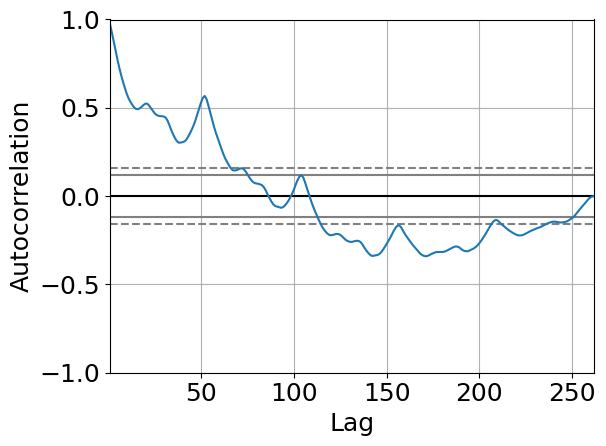

In [46]:
# lags based on weeks
lagvec=[1,25,52,52*2,int(52*2.5)]
for lag in lagvec:
    x=train_ts.autocorr(lag=lag)
    print(x)
pd.plotting.autocorrelation_plot(train_ts)

Seems like the series has a nice correlation for a year data (around 52 weeks) and also 26 weeks. The correlation goes down for 2 or larger years. 

#### Decomposing the series

The series can be decomposed into trend, sesonality and residual.

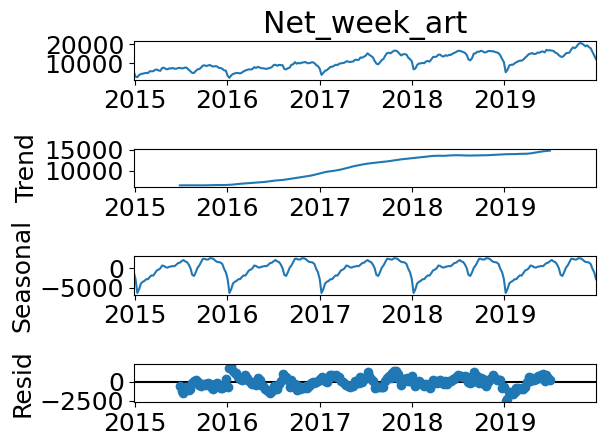

In [48]:
import statsmodels.api as sm
result=sm.tsa.seasonal_decompose(train_ts,model='add',period=52*1)

# plt.figure*()
fig1=result.plot()
fig1.tight_layout()
#based on the figure we see residual of 250
resid=2000.0

There is clearly an increasing trend which migh plateau in 2020. Importantly the seasonality pattern suggests that there are definite times in the year when certain orders are placed. 

**Important**

The residual (resid) gives a hint that these are spurious orders over the years which have will be difficult to be captured by the prediction algorithm. Thus, we can say that the uncertainty in our prediction would be around the max of this residual i.e. *250*


#### Model

In [49]:
model_20=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_20.fit()#location
artikel_data_loc=os.path.join(forecast_data,region,artikel_code)
summary_loc=os.path.join(artikel_data_loc,'model_summary.data')
with open(summary_loc,'w') as f:
    f.write(str(mod_result.summary()))

print(mod_result.summary())


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  262
Model:             ExponentialSmoothing   SSE                       62386913.312
Optimized:                         True   AIC                           3357.697
Trend:                         Additive   BIC                           3561.092
Seasonal:                Multiplicative   AICC                          3392.746
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         11:59:27
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.8889286                alpha                 True
smoothing_trend          

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Testing for the fitting of model versus observed data.

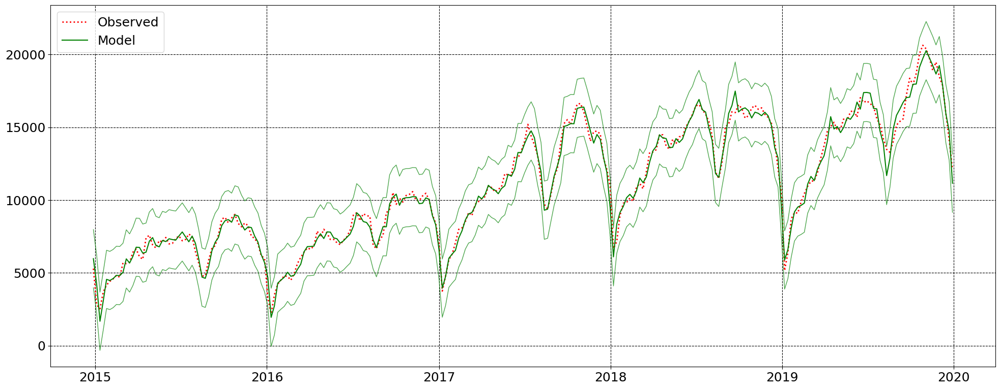

In [50]:
importlib.reload(ff)
fname=os.path.join(artikel_data_loc,'Testing_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)


Testing for forecasting on 2020.

In [51]:
#2020 observations ts
start_year_train=ini_start_year_train
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
vald_ts=artikel_ts[start:start+52*end_int+1]
print(vald_ts)
# print(vald_ts[-53:-49])
#take initial 1521 at week 1

2015-01-04     2807.0
2015-01-11     2534.0
2015-01-18     3690.0
2015-01-25     4163.0
2015-02-01     4418.0
               ...   
2020-11-29    19507.0
2020-12-06    19797.0
2020-12-13    18987.0
2020-12-20    18526.0
2020-12-27    15571.0
Name: Net_week_art, Length: 313, dtype: float64


Saving done


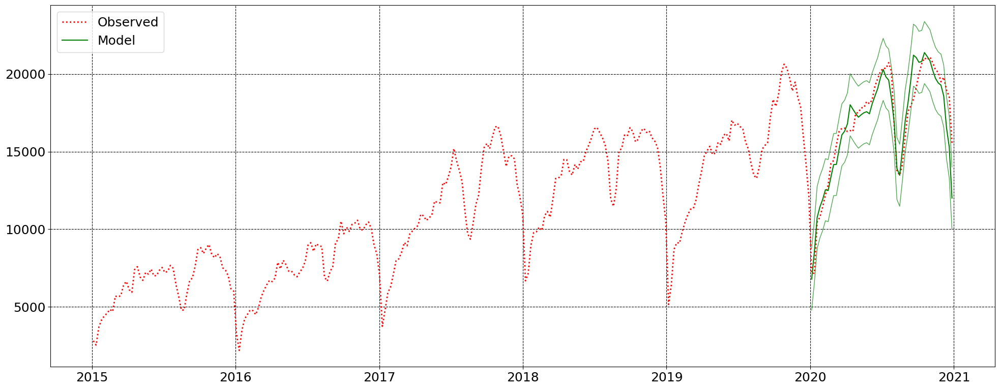

In [52]:
importlib.reload(ff)
forecast_2020=mod_result.forecast(52)
# simulate_2020=mod_result.simulate(52,repetitions=10)
fname=os.path.join(artikel_data_loc,'Testing_Forecast_2020.jpg')
ff.plot_mod_obs(vald_ts,forecast_2020,resid,fname)
fname='Forecast_2020.csv'
ff.create_fcast_csv(forecast_2020,resid,fname,artikel_data_loc)

### Validation

(Corona effect)

Now the train_ts is replaced by the validation ts and a 2021 forecast is made

In [58]:
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts)

2016-01-03     3281.0
2016-01-10     2195.0
2016-01-17     3499.0
2016-01-24     4228.0
2016-01-31     4511.0
               ...   
2020-11-29    19507.0
2020-12-06    19797.0
2020-12-13    18987.0
2020-12-20    18526.0
2020-12-27    15571.0
Name: Net_week_art, Length: 261, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  261
Model:             ExponentialSmoothing   SSE                      116973249.168
Optimized:                         True   AIC                           3510.376
Trend:                         Additive   BIC                           3713.554
Seasonal:                Multiplicative   AICC                          3545.600
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         12:00:18
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.5353571                alpha                 True
smoothing_trend          

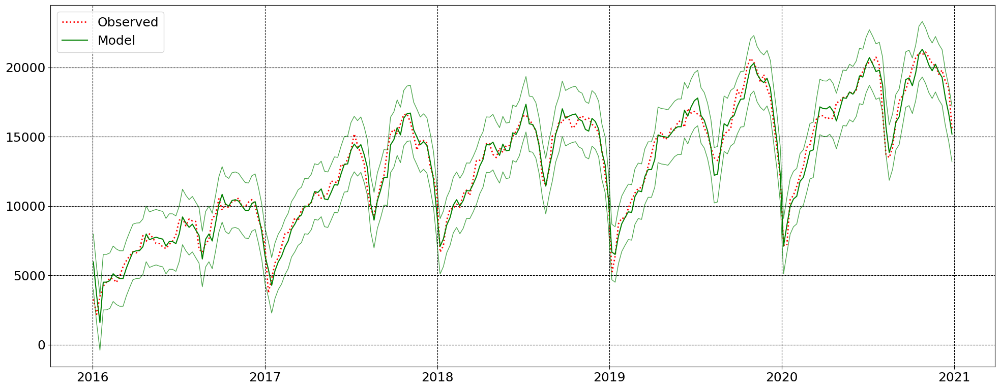

In [59]:
model_21=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
mod_result=model_21.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

*Forecast for 2021*

In [60]:
#2021 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
vald21_ts=artikel_ts[start:start+52*end_int+2]
print(vald21_ts)
# print(vald21_ts[-53:-49])

2017-01-01     7036.0
2017-01-08     3749.0
2017-01-15     4778.0
2017-01-22     5903.0
2017-01-29     6287.0
               ...   
2021-12-05    21962.0
2021-12-12    21708.0
2021-12-19    21200.0
2021-12-26    19499.0
2022-01-02    16617.0
Name: Net_week_art, Length: 262, dtype: float64


Plotting against observed

Saving done


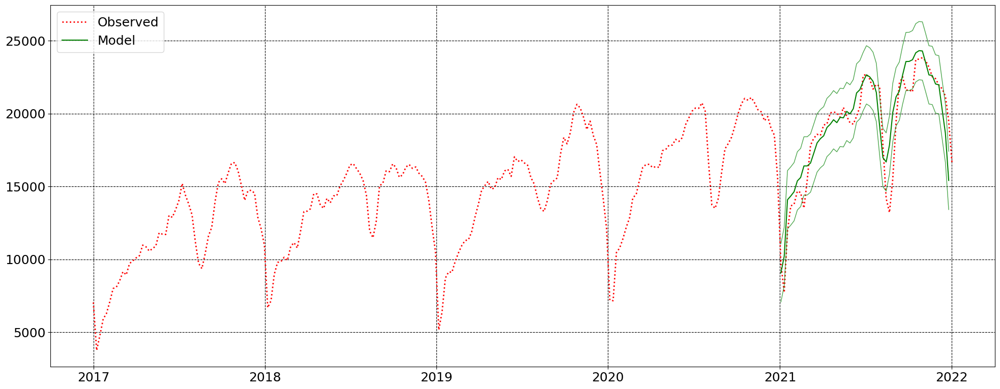

In [61]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()
fname=os.path.join(artikel_data_loc,'Validation_forecast_2021.jpg')
ff.plot_mod_obs(vald21_ts,forecast_2021,resid,fname)
fname='Forecast_2021.csv'
ff.create_fcast_csv(forecast_2021,resid,fname,artikel_data_loc)

### Forecast 2022

Train data till 2021


In [74]:
#2022 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52+0)
end_int=int(2022-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+3]
print(train_ts)

2017-01-01     7036.0
2017-01-08     3749.0
2017-01-15     4778.0
2017-01-22     5903.0
2017-01-29     6287.0
               ...   
2021-12-12    21708.0
2021-12-19    21200.0
2021-12-26    19499.0
2022-01-02    16617.0
2022-01-09     8968.0
Name: Net_week_art, Length: 263, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  263
Model:             ExponentialSmoothing   SSE                      244920312.480
Optimized:                         True   AIC                           3728.748
Trend:                         Additive   BIC                           3932.361
Seasonal:                Multiplicative   AICC                          3763.625
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         12:03:02
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9596429                alpha                 True
smoothing_trend          

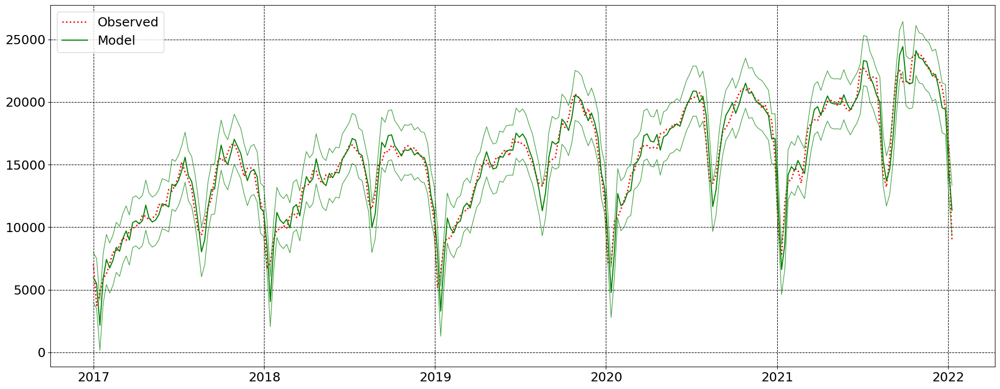

In [75]:
model_22=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_21._initial_level,initial_seasonal=model_21._initial_seasonal,initial_trend=model_21._initial_trend)
# model_22=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_22.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2022.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

In [76]:
#2021 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald22_ts=artikel_ts[start:start+52*end_int+2]
print(vald22_ts)
# print(vald22_ts[-53:-49])


2017-12-31    10957.0
2018-01-07     6679.0
2018-01-14     7151.0
2018-01-21     8969.0
2018-01-28     9785.0
               ...   
2022-12-04    25490.0
2022-12-11    24682.0
2022-12-18    22225.0
2022-12-25    20596.0
2023-01-01    15651.0
Name: Net_week_art, Length: 262, dtype: float64


Saving done


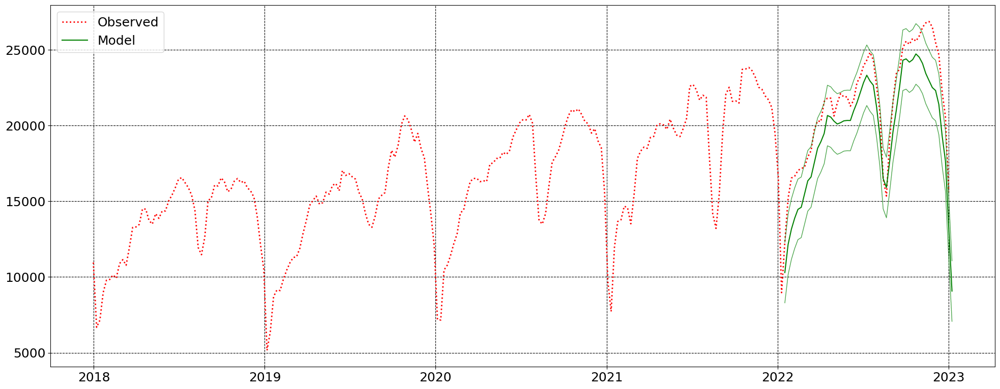

In [77]:
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()
#since the forecast depends on the starting value
# forecast_2022=forecast_2022-1920
mod_net=pd.concat([mod_result.fittedvalues,forecast_2022])
#2021 forecast time series
fname=os.path.join(artikel_data_loc,'Forecast22.jpg')
ff.plot_mod_obs(vald22_ts,forecast_2022,resid,fname)
fname='Forecast_2022.csv'
ff.create_fcast_csv(forecast_2022,resid,fname,artikel_data_loc)

### Forecast 2023

Train data till 2022


In [81]:
#2022 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52+0)
end_int=int(2023-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+3]
print(train_ts)

2017-12-31    10957.0
2018-01-07     6679.0
2018-01-14     7151.0
2018-01-21     8969.0
2018-01-28     9785.0
               ...   
2022-12-04    25490.0
2022-12-11    24682.0
2022-12-18    22225.0
2022-12-25    20596.0
2023-01-01    15651.0
Name: Net_week_art, Length: 262, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  262
Model:             ExponentialSmoothing   SSE                      263953366.928
Optimized:                         True   AIC                           3735.610
Trend:                         Additive   BIC                           3939.006
Seasonal:                Multiplicative   AICC                          3770.659
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         12:06:17
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9596429                alpha                 True
smoothing_trend          

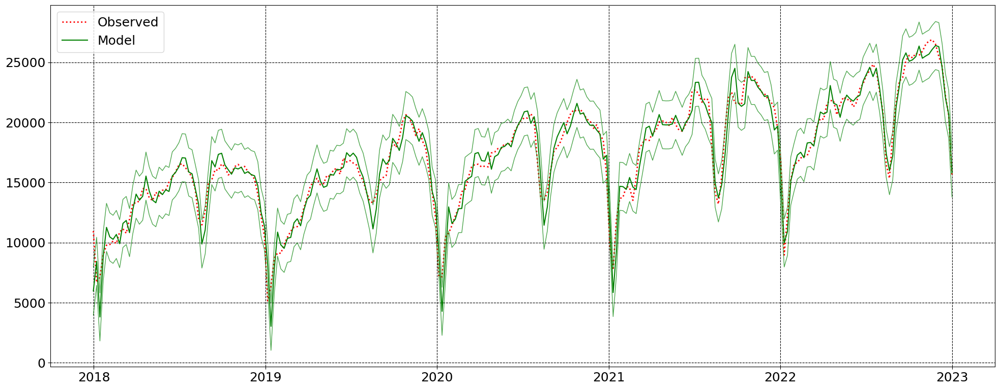

In [83]:
model_23=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_22._initial_level,initial_seasonal=model_22._initial_seasonal,initial_trend=model_22._initial_trend)
# model_23=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_23.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2023.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

In [85]:
#2022 observations ts
start_year_train=ini_start_year_train+4
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald23_ts=artikel_ts[start:start+52*end_int+2]
print(vald23_ts)
# print(vald22_ts[-53:-49])


2018-12-30    10511.0
2019-01-06     5155.0
2019-01-13     6391.0
2019-01-20     8708.0
2019-01-27     9137.0
               ...   
2022-12-04    25490.0
2022-12-11    24682.0
2022-12-18    22225.0
2022-12-25    20596.0
2023-01-01    15651.0
Name: Net_week_art, Length: 210, dtype: float64


Saving done


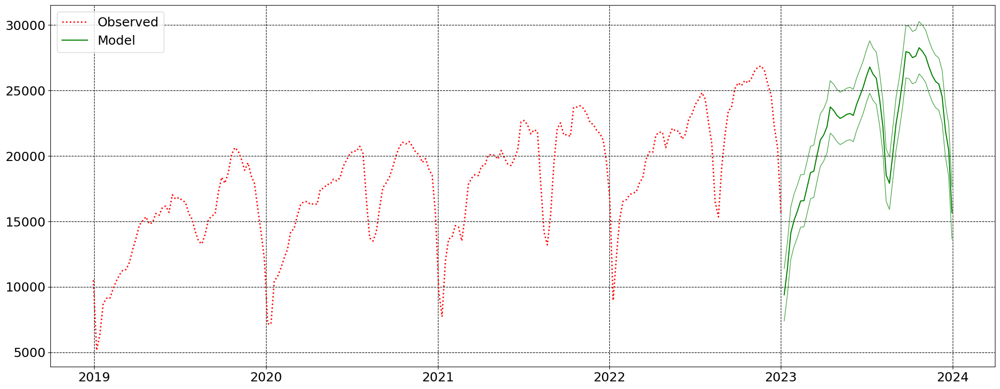

In [86]:
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()
#since the forecast depends on the starting value
# forecast_2022=forecast_2022-1920
mod_net=pd.concat([mod_result.fittedvalues,forecast_2023])
#2021 forecast time series
fname=os.path.join(artikel_data_loc,'Forecast23.jpg')
ff.plot_mod_obs(vald23_ts,forecast_2023,resid,fname)
fname='Forecast_2023.csv'
ff.create_fcast_csv(forecast_2023,resid,fname,artikel_data_loc)

##### **END BAAK** 

## **P3**

In [100]:

importlib.reload(ff)
region='All Locations'
artikel_code='P3'
ini_start_year_train=2015
end_year_train=2019
artikel_ts,train_ts=ff.get_data_series(region,artikel_code,dirname,ini_start_year_train,end_year_train)
# print('Training series is:'+str(train_ts))
train_ts=train_ts[2:]
print('Training series is:'+str(train_ts))

Training series is:2014-12-28     5248.0
2015-01-04     2598.0
2015-01-11     2263.0
2015-01-18     3404.0
2015-01-25     4365.0
               ...   
2019-12-01    16077.0
2019-12-08    15321.0
2019-12-15    14859.0
2019-12-22    14087.0
2019-12-29    11813.0
Name: Net_week_art, Length: 262, dtype: float64


### ***Model Developement and Validation***

Note that some time one needs to adjust the training time seires to have a correct prediction start.

#### Time series analysis

Now we plot a Auto correlation of the time series to see whether it correlates to a yearly data.

0.9739382178334262
0.7804246422736152
0.8015146556938654
0.6458165192942825
0.7863111978244322


<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

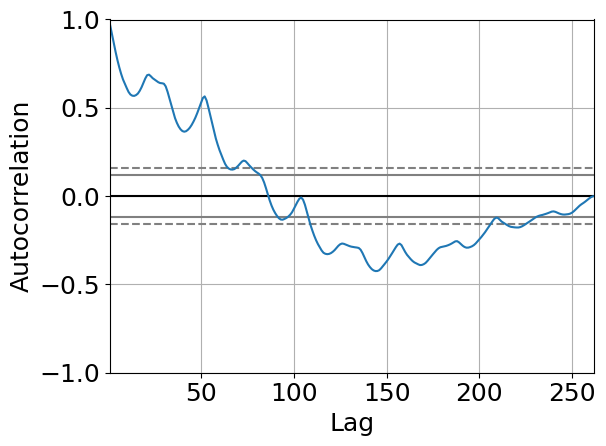

In [101]:
# lags based on weeks
lagvec=[1,25,52,52*2,int(52*3)]
for lag in lagvec:
    x=train_ts.autocorr(lag=lag)
    print(x)
pd.plotting.autocorrelation_plot(train_ts)

Seems like the series has a nice correlation for a year data (around 52 weeks) and also 26 weeks. The correlation goes down for 2 or larger years. 

#### Decomposing the series

The series can be decomposed into trend, sesonality and residual.

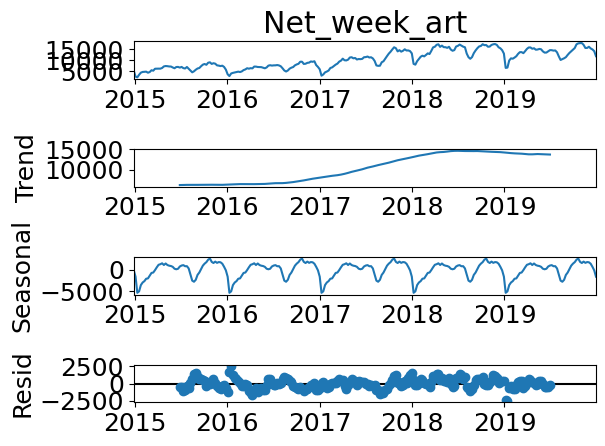

In [102]:
import statsmodels.api as sm
result=sm.tsa.seasonal_decompose(train_ts,model='add',period=52*1)

# plt.figure*()
fig1=result.plot()
fig1.tight_layout()
#based on the figure we see residual of 250
resid=2000.0

There is clearly an increasing trend which migh plateau in 2020. Importantly the seasonality pattern suggests that there are definite times in the year when certain orders are placed. 

**Important**

The residual (resid) gives a hint that these are spurious orders over the years which have will be difficult to be captured by the prediction algorithm. Thus, we can say that the uncertainty in our prediction would be around the max of this residual i.e. *250*


#### Model

In [105]:
model_20=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_20.fit()#location
artikel_data_loc=os.path.join(forecast_data,region,artikel_code)
summary_loc=os.path.join(artikel_data_loc,'model_summary.data')
with open(summary_loc,'w') as f:
    f.write(str(mod_result.summary()))

print(mod_result.summary())


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  262
Model:             ExponentialSmoothing   SSE                       58849668.984
Optimized:                         True   AIC                           3342.404
Trend:                         Additive   BIC                           3545.800
Seasonal:                Multiplicative   AICC                          3377.453
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         12:10:26
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9950000                alpha                 True
smoothing_trend          

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Testing for the fitting of model versus observed data.

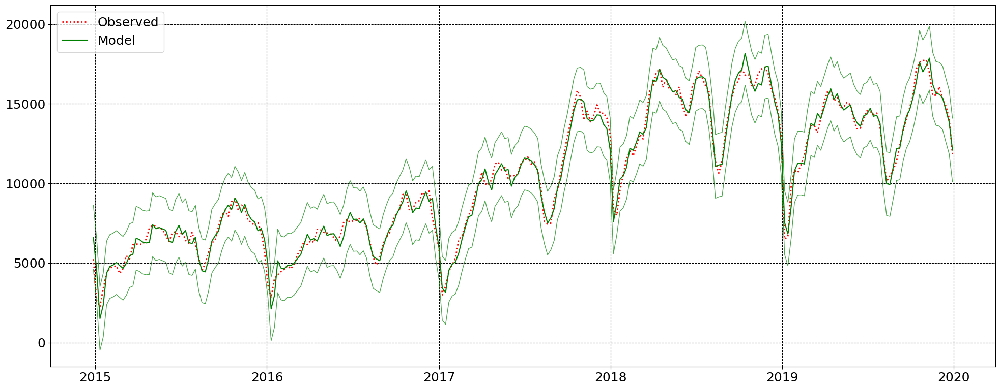

In [106]:
importlib.reload(ff)
fname=os.path.join(artikel_data_loc,'Testing_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)


Testing for forecasting on 2020.

In [107]:
#2020 observations ts
start_year_train=ini_start_year_train
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
vald_ts=artikel_ts[start:start+52*end_int+1]
print(vald_ts)
# print(vald_ts[-53:-49])
#take initial 1521 at week 1

2015-01-04     2598.0
2015-01-11     2263.0
2015-01-18     3404.0
2015-01-25     4365.0
2015-02-01     4686.0
               ...   
2020-11-29    16400.0
2020-12-06    16680.0
2020-12-13    15793.0
2020-12-20    15137.0
2020-12-27    12913.0
Name: Net_week_art, Length: 313, dtype: float64


Saving done


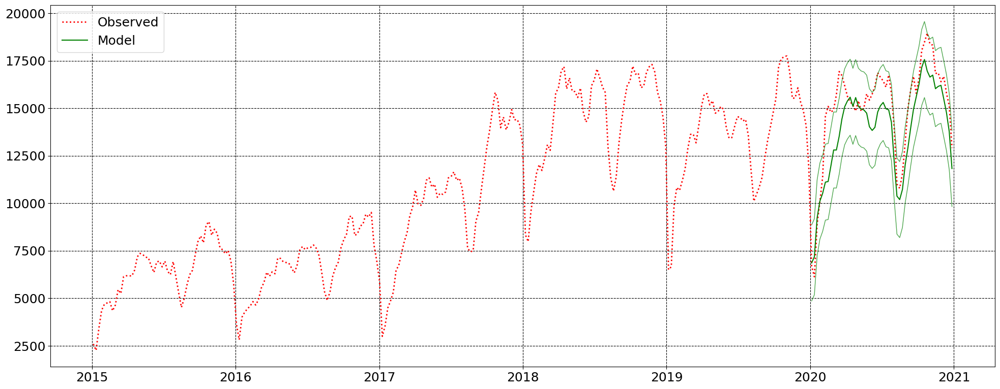

In [108]:
importlib.reload(ff)
forecast_2020=mod_result.forecast(52)
# simulate_2020=mod_result.simulate(52,repetitions=10)
fname=os.path.join(artikel_data_loc,'Testing_Forecast_2020.jpg')
ff.plot_mod_obs(vald_ts,forecast_2020,resid,fname)
fname='Forecast_2020.csv'
ff.create_fcast_csv(forecast_2020,resid,fname,artikel_data_loc)

### Validation

(Corona effect)

Now the train_ts is replaced by the validation ts and a 2021 forecast is made

In [109]:
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts)

2016-01-03     3641.0
2016-01-10     2823.0
2016-01-17     4004.0
2016-01-24     4274.0
2016-01-31     4453.0
               ...   
2020-11-29    16400.0
2020-12-06    16680.0
2020-12-13    15793.0
2020-12-20    15137.0
2020-12-27    12913.0
Name: Net_week_art, Length: 261, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  261
Model:             ExponentialSmoothing   SSE                       68751084.440
Optimized:                         True   AIC                           3371.667
Trend:                         Additive   BIC                           3574.845
Seasonal:                Multiplicative   AICC                          3406.891
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         12:11:09
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9950000                alpha                 True
smoothing_trend          

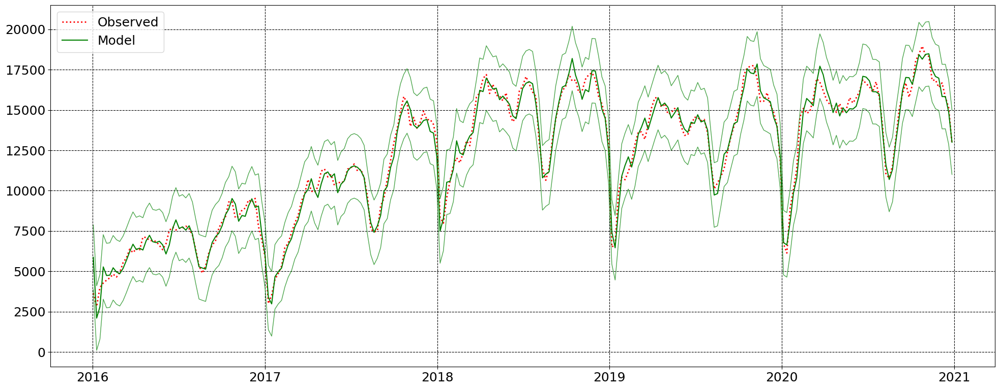

In [111]:
# model_21=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
model_21=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')

mod_result=model_21.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

*Forecast for 2021*

In [112]:
#2021 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
vald21_ts=artikel_ts[start:start+52*end_int+2]
print(vald21_ts)
# print(vald21_ts[-53:-49])

2017-01-01     5890.0
2017-01-08     3003.0
2017-01-15     3541.0
2017-01-22     4499.0
2017-01-29     4867.0
               ...   
2021-12-05    21354.0
2021-12-12    21478.0
2021-12-19    20687.0
2021-12-26    19166.0
2022-01-02    15946.0
Name: Net_week_art, Length: 262, dtype: float64


Plotting against observed

Saving done


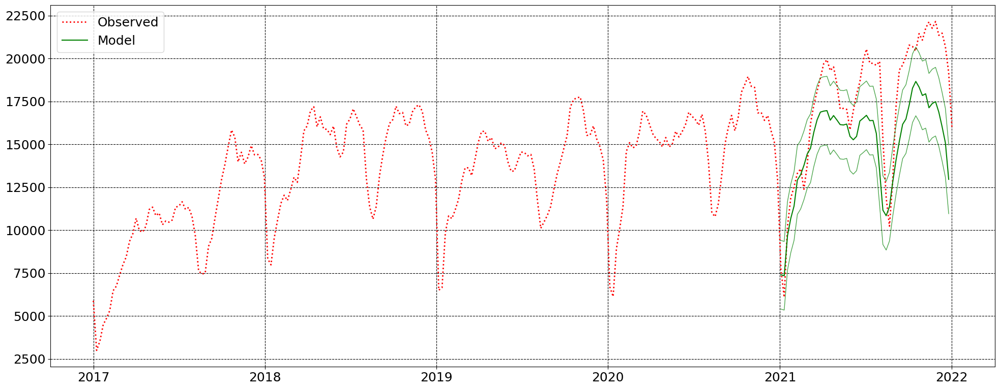

In [113]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()
fname=os.path.join(artikel_data_loc,'Validation_forecast_2021.jpg')
ff.plot_mod_obs(vald21_ts,forecast_2021,resid,fname)
fname='Forecast_2021.csv'
ff.create_fcast_csv(forecast_2021,resid,fname,artikel_data_loc)

### Forecast 2022

Train data till 2021


In [114]:
#2022 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52+0)
end_int=int(2022-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+3]
print(train_ts)

2017-01-01     5890.0
2017-01-08     3003.0
2017-01-15     3541.0
2017-01-22     4499.0
2017-01-29     4867.0
               ...   
2021-12-12    21478.0
2021-12-19    20687.0
2021-12-26    19166.0
2022-01-02    15946.0
2022-01-09     7945.0
Name: Net_week_art, Length: 263, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  263
Model:             ExponentialSmoothing   SSE                      194835047.499
Optimized:                         True   AIC                           3668.579
Trend:                         Additive   BIC                           3872.192
Seasonal:                Multiplicative   AICC                          3703.456
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         12:12:01
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.8889286                alpha                 True
smoothing_trend          

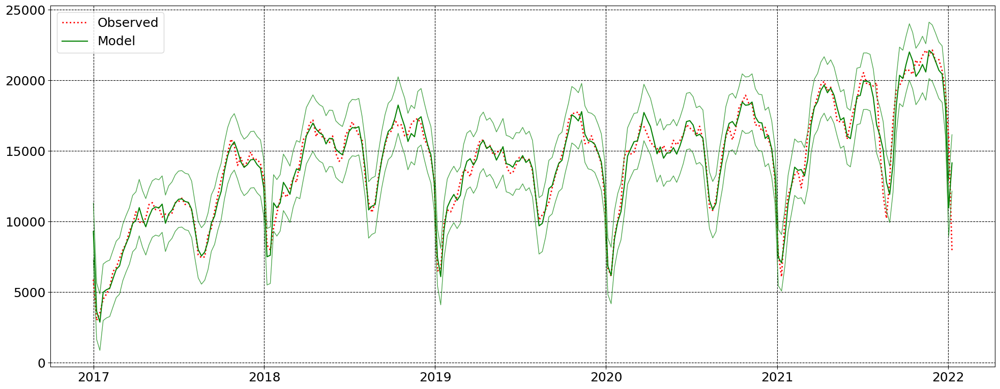

In [116]:
# model_22=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_21._initial_level,initial_seasonal=model_21._initial_seasonal,initial_trend=model_21._initial_trend)
model_22=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_22.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2022.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

In [117]:
#2021 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald22_ts=artikel_ts[start:start+52*end_int+2]
print(vald22_ts)
# print(vald22_ts[-53:-49])


2017-12-31    13079.0
2018-01-07     8343.0
2018-01-14     7985.0
2018-01-21     9566.0
2018-01-28    10591.0
               ...   
2022-12-04    22699.0
2022-12-11    21536.0
2022-12-18    20963.0
2022-12-25    17959.0
2023-01-01    14740.0
Name: Net_week_art, Length: 262, dtype: float64


Saving done


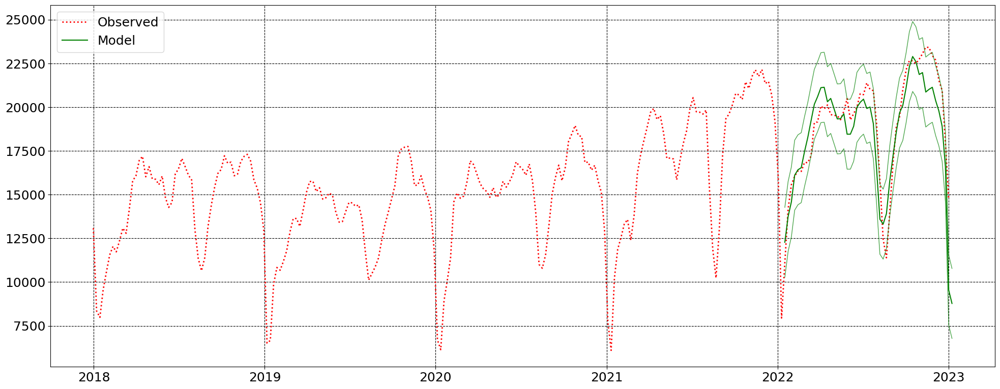

In [118]:
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()
#since the forecast depends on the starting value
# forecast_2022=forecast_2022-1920
mod_net=pd.concat([mod_result.fittedvalues,forecast_2022])
#2021 forecast time series
fname=os.path.join(artikel_data_loc,'Forecast22.jpg')
ff.plot_mod_obs(vald22_ts,forecast_2022,resid,fname)
fname='Forecast_2022.csv'
ff.create_fcast_csv(forecast_2022,resid,fname,artikel_data_loc)

### Forecast 2023

Train data till 2022


In [119]:
#2022 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52+0)
end_int=int(2023-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+3]
print(train_ts)

2017-12-31    13079.0
2018-01-07     8343.0
2018-01-14     7985.0
2018-01-21     9566.0
2018-01-28    10591.0
               ...   
2022-12-04    22699.0
2022-12-11    21536.0
2022-12-18    20963.0
2022-12-25    17959.0
2023-01-01    14740.0
Name: Net_week_art, Length: 262, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  262
Model:             ExponentialSmoothing   SSE                      155038848.721
Optimized:                         True   AIC                           3596.201
Trend:                         Additive   BIC                           3799.596
Seasonal:                Multiplicative   AICC                          3631.250
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         12:12:42
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9950000                alpha                 True
smoothing_trend          

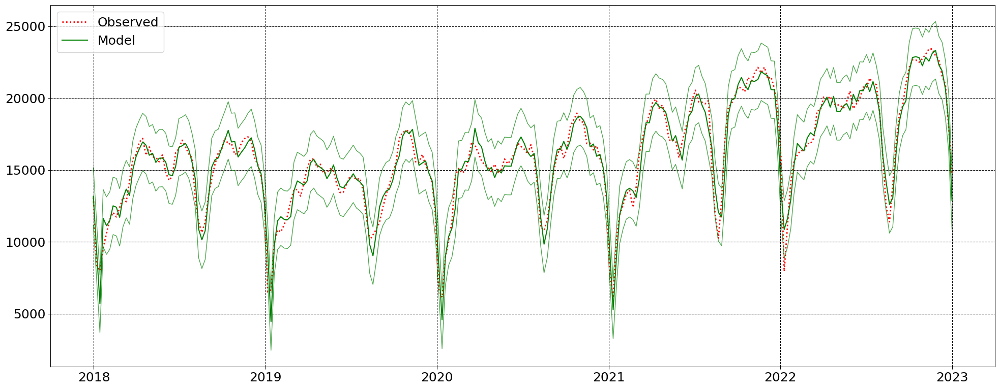

In [123]:
# model_23=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_22._initial_level,initial_seasonal=model_22._initial_seasonal,initial_trend=model_22._initial_trend)
model_23=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_23.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2023.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,resid,fname)
print(mod_result.summary())

In [124]:
#2022 observations ts
start_year_train=ini_start_year_train+4
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald23_ts=artikel_ts[start:start+52*end_int+2]
print(vald23_ts)
# print(vald22_ts[-53:-49])


2018-12-30    12982.0
2019-01-06     6509.0
2019-01-13     6661.0
2019-01-20     9865.0
2019-01-27    10834.0
               ...   
2022-12-04    22699.0
2022-12-11    21536.0
2022-12-18    20963.0
2022-12-25    17959.0
2023-01-01    14740.0
Name: Net_week_art, Length: 210, dtype: float64


Saving done


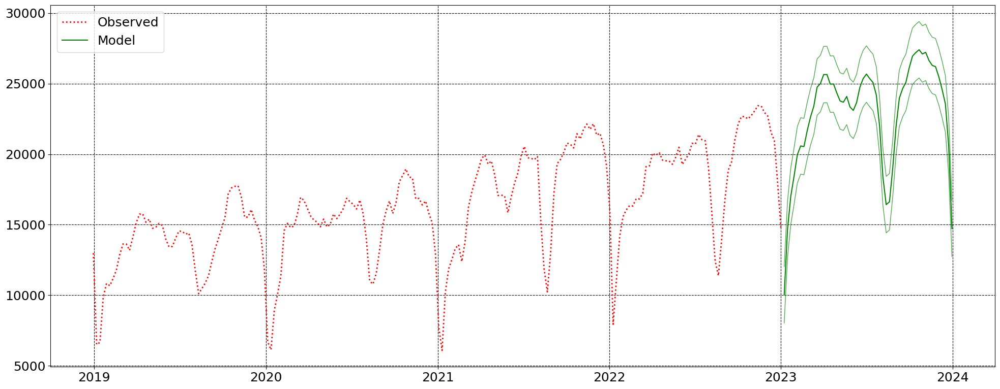

In [125]:
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()
#since the forecast depends on the starting value
# forecast_2022=forecast_2022-1920
mod_net=pd.concat([mod_result.fittedvalues,forecast_2023])
#2021 forecast time series
fname=os.path.join(artikel_data_loc,'Forecast23.jpg')
ff.plot_mod_obs(vald23_ts,forecast_2023,resid,fname)
fname='Forecast_2023.csv'
ff.create_fcast_csv(forecast_2023,resid,fname,artikel_data_loc)

##### **END P3** 